Copied and pasted from a Colab notebook on January 26 2025

# Imports and Misc

In [ ]:
!pip3 install shapflow
!pip install shap
!apt install libgraphviz-dev
!pip install pygraphviz

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.9/51.9 kB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.4/119.4 kB 2.0 MB/s eta 0:00:00
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  libgail-common libgail18 libgtk2.0-0 libgtk2.0-bin libgtk2.0-common libgvc6-plugins-gtk
  librsvg2-common libxdot4
Suggested packages:
  gvfs
The following NEW packages will be installed:
  libgail-common libgail18 libgraphviz-dev libgtk2.0-0 libgtk2.0-bin libgtk2.0-common
  libgvc6-plugins-gtk librsvg2-common libxdot4
0 upgraded, 9 newly installed, 0 to remove and 49 not upgraded.
Need to get 2,434 kB of archives.
After this operation, 7,681 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 libgtk2.0-common all 2.24.33-2ubuntu2.1 [125 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 libgtk2.0-0 amd64 2.24.3

In [1]:
from ast import literal_eval
import types
from functools import partial
from graphviz import Digraph
import inspect
from itertools import islice
import random
import math
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import pandas as pd
from pprint import pprint
from scipy.stats.mstats import zscore

In [4]:
from shapflow import flow
# flow specific packages
from shapflow.flow import Node, CreditFlow, Graph, get_source_nodes, flatten_graph, eval_graph, boundary_graph, single_source_graph, viz_graph, save_graph, hcluster_graph
from shapflow.flow import ParallelCreditFlow, GraphExplainer, translator
from shapflow.flow import group_nodes, build_feature_graph
from shapflow.flow import CausalLinks, create_xgboost_f, create_linear_f
from shapflow.flow import edge_credits2edge_credit
# from shapflow.on_manifold import OnManifoldExplainer, IndExplainer, FeatureAttribution
# from shapflow.linear_evaluation import get_error, get_indirect_effect_flow, get_effect_asv, get_effect_ind, get_effect_manifold, get_direct_effect_flow
# from shapflow.linear_evaluation import get_direct_effect_ground_truth, get_indirect_effect_ground_truth


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Computational Graph

## Computational Graph Class and Helper Functions

In [5]:
'''
Bug 1: Run the below code and look at the gradient of -b. It is technically correct depending on the interpretation of a term.
However, it does not make sense mathematically. This bug is not that big of a deal IMO.

Value.reset()
a = Value(1, label="a")
b = Value(2, label="b")
d = a - b -b + b -5 * b
draw_computational_graph(d)

The solution is to wrap minus signs as negative signs like this:
d = a - b -b + b + (-b) * 5
'''

class Value:
    """
    Stores a single scalar value and its gradient.
    Assumes each instance of Value has a unique 'label'
    """
    # values_used_so_far is a class variable that keeps track of the instances of Value already created.
    # We store instances of Value by their unique 'label', which maps to its respective Value object in a Dict
    values_used_so_far = {}
    def __init__(self, data, _children=(), _op='', label=''):
        self.data = data
        self.grad = 0
        self.label = label
        self.score = 0
        # internal variables used for autograd graph construction
        self._backward = lambda: None
        self._prev = set(_children)
        self._op = _op # the op that produced this node, for graphviz / debugging / etc

        # Check if there is already an instance of Value with the same label
        if self.label in Value.values_used_so_far:
            raise Exception(f"Error: label '{self.label}' already in use")
        else:
            # add this new instance of Value to dict of all Values created thus far
            Value.values_used_so_far[self.label] = self

        # print(f"Value {self.label} init")
        # pprint(Value.values_used_so_far)

    def __add__(self, other):
        if not isinstance(other, Value):
            # Check if there is already another instance of 'other'
            if str(other) in Value.values_used_so_far:
                # Make 'other' point to the already existing Instance with its label
                other = Value.values_used_so_far[str(other)]
            else:
                other = Value(other, label=str(other))

        # If 'other' has label that starts with minus sign ('-'), then the label of 'out' should not use a '+' sign
        # e.g., 'a + -b' should be written as 'a - b'.
        if other.label[0] == '-':
            new_label = '(' + self.label + other.label + ')'
        else:
            new_label = '(' + self.label + '+' + other.label + ')'

        if new_label in Value.values_used_so_far:
            out = Value.values_used_so_far[new_label]
        else:
            out = Value(self.data + other.data, (self, other), '+', new_label)

        def _backward():
            self.grad += out.grad
            other.grad += out.grad
        out._backward = _backward

        return out

    def __mul__(self, other):
        if isinstance(other, Value):
            # Ensure when multiplied by -1 that it is rendered correctly (i.e. we don't want a * -1; rather, we want -a)
            if other.data == -1:
                new_label = '(-' + self.label + ')'
            else:
                new_label = '(' + other.label + '*' + self.label + ')'
        else:
            if str(other) in Value.values_used_so_far:
                other = Value.values_used_so_far[str(other)]
            else:
                other = Value(other, label=str(other))

            # If multiplying by negative -1, we just prepend '-' to self.label.
            if other.data == -1:
                new_label = '(-' + self.label + ')'
            else:
                new_label = '(' + other.label + '*' + self.label + ')'

        if new_label in Value.values_used_so_far:
            out = Value.values_used_so_far[new_label]
        else:
            out = Value(self.data * other.data, (self, other), '*', new_label)

        def _backward():
            self.grad += other.data * out.grad
            other.grad += self.data * out.grad
        out._backward = _backward

        return out

    def __pow__(self, other):
        assert isinstance(other, (int, float)), "only supporting int/float powers for now"

        new_label = '(' + self.label + '**' + str(other) + ')'
        if new_label in Value.values_used_so_far:
            out = Value.values_used_so_far[new_label]
        else:
            out = Value(self.data**other, (self,), f'**{other}', '(' + self.label + '**' + str(other) + ')')

        def _backward():
            self.grad += (other * self.data**(other-1)) * out.grad
        out._backward = _backward

        return out

    def abs(self):
        new_label = '|' + self.label + '|'
        if new_label in Value.values_used_so_far:
            out = Value.values_used_so_far[new_label]
        else:
            out = Value(np.abs(self.data), (self,), 'abs', '|' + self.label + '|')

        def _backward():
            self.grad += np.sign(self.data) * out.grad
        out._backward = _backward

        return out

    def exp(self):
        new_label = 'e^(' + self.label + ')'
        if new_label in Value.values_used_so_far:
            out = Value.values_used_so_far[new_label]
        else:
            out = Value(np.exp(self.data), (self,), 'exp', 'e^(' + self.label + ')')

        def _backward():
            self.grad += out.data * out.grad
        out._backward = _backward

        return out

    def __neg__(self): # -self
        # First, check if -self already exists
        if '-' + self.label in Value.values_used_so_far:
            return Value.values_used_so_far['-' + self.label]

        # Second, check if '-1' already exists
        if '-1' in Value.values_used_so_far:
            negative_1 = Value.values_used_so_far['-1']
        else:
            negative_1 = Value(-1, label='-1')

        # We create a new Value for '-self'
        return self * negative_1

    def __radd__(self, other): # other + self
        return self + other

    def __sub__(self, other): # self - other
        return self + (-other)

    def __rsub__(self, other): # other - self
        return other + (-self)

    def __rmul__(self, other): # other * self
        return self * other

    def __truediv__(self, other): # self / other
        return self * other**-1

    def __rtruediv__(self, other): # other / self
        return other * self**-1

    def __repr__(self):
        return f"Value(data={self.data}, grad={self.grad}, label={self.label})"

    def backward(self):
        # topological order all of the children in the graph
        topo = []
        visited = set()
        def build_topo(v):
            if v not in visited:
                visited.add(v)
                for child in v._prev:
                    build_topo(child)
                topo.append(v)
        build_topo(self)

        # go one variable at a time and apply the chain rule to get its gradient
        self.grad = 1
        for v in reversed(topo):
            v._backward()

    @classmethod
    def reset(cls):
        cls.values_used_so_far = {}

In [6]:
def trace(root):
    """
    Creates set of nodes and edges given some root node as input
    using DFS and backtracing through each node's children
    """
    nodes, edges = set(), set()
    def build(v):
        if v not in nodes:
            nodes.add(v)
            for child in v._prev:
                edges.add((child, v))
                build(child)
    build(root)
    return nodes, edges

def draw_computational_graph(root, format='png', rankdir='LR', disable_data_field=False, disable_grad_field=False):
    """
    Creates a computational digraph

    format: png | svg | ...
    rankdir: TB (top to bottom graph) | LR (left to right)
    """
    assert rankdir in ['LR', 'TB']
    nodes, edges = trace(root)
    dot = Digraph(format=format, graph_attr={'rankdir': rankdir}) #, node_attr={'rankdir': 'TB'})

    for n in nodes:
        if disable_data_field and disable_grad_field:
            dot.node(name=str(id(n)), label = n.label, shape='record')
        elif disable_data_field:
            dot.node(name=str(id(n)), label = "{ %s | grad %.4f }" % (n.label, n.grad), shape='record')
        elif disable_grad_field:
            dot.node(name=str(id(n)), label = "{ %s | data %.4f }" % (n.label, n.data), shape='record')
        else:
            dot.node(name=str(id(n)), label = "{ %s | data %.4f | grad %.4f }" % (n.label, n.data, n.grad), shape='record')

        if n._op:
            dot.node(name=str(id(n)) + n._op, label=n._op)
            dot.edge(str(id(n)) + n._op, str(id(n)))

    # For each pair of nodes that share an edge, add an edge from the parent node to the _op node
    for n1, n2 in edges:
        dot.edge(str(id(n1)), str(id(n2)) + n2._op)

    return dot

def draw_computational_graph_with_score(root, format='png', rankdir='LR'):
    """
    Creates a computational digraph with each term given a score for it's
    average influence on the final output (gradient scoring)

    format: png | svg | ...
    rankdir: TB (top to bottom graph) | LR (left to right)
    """

    assert rankdir in ['LR', 'TB']
    nodes, edges = trace(root)
    dot = Digraph(format=format, graph_attr={'rankdir': rankdir}) #, node_attr={'rankdir': 'TB'})

    for n in nodes:
        dot.node(name=str(id(n)), label = "{ %s | score %.4f }" % (n.label, n.score), shape='record')
        if n._op:
            dot.node(name=str(id(n)) + n._op, label=n._op)
            dot.edge(str(id(n)) + n._op, str(id(n)))

    for n1, n2 in edges:
        dot.edge(str(id(n1)), str(id(n2)) + n2._op)

    return dot


In [7]:
def zero_grad(nodes):
    """
    Zero out of every gradient of each node in nodes
    """
    for n in nodes:
        n.grad = 0

In [8]:
def topo_sort(node):
    ''''
    Topological order all of the children of 'node' in the graph
    '''

    topo = []
    visited = set()

    def build_topo(v):
        if v not in visited:
            visited.add(v)
            for child in v._prev:
                build_topo(child)
            topo.append(v)

    build_topo(node)
    return topo

## Test Computational Graph on Bubble Column Equation

In [ ]:
# Reset all class variables. This is necessary to ensure Value is tracking
# only the instances that are in use for this computational digraph.
Value.reset()

# input variables
CT1     = Value(0.1,            label='CT1')
FI1     = Value(0.1,            label='FI1')
FI2     = Value(0.1,            label='FI2')

# constants
beta1   = Value(0.00913647,     label='beta1')
beta2   = Value(0.06013975,     label='beta2')
beta3   = Value(-0.00306957,    label='beta3')
beta4   = Value(-0.00022621,    label='beta4')
beta5   = Value(-0.00948349,    label='beta5')
beta6   = Value(-0.04911336,    label='beta6')
beta7   = Value(-0.09026852,    label='beta7')
beta8   = Value(-0.03344445,    label='beta8')
beta9   = Value(-0.03477052,    label='beta9')
b       = Value(0.1958815,      label='b')

# f terms
f1      = beta1 * (-CT1)*(-FI1)*(-FI1).exp()        ; f1.label = 'f1'
f2      = beta2 * (-FI1)*(-CT1).exp()               ; f2.label = 'f2'
f3      = beta3 * (-FI1)*(-FI1).exp()*(-FI1**3)     ; f3.label = 'f3'
f4      = beta4 * (FI1**3)*(-CT1**2)*(FI1).exp()    ; f4.label = 'f4'
f5      = beta5 * (-CT1)*(-FI1).exp()*(-FI1).exp()  ; f5.label = 'f5'
f6      = beta6 * (CT1)*(FI2).exp()                 ; f6.label = 'f6'
f7      = beta7 * (-CT1)*(-CT1).exp()               ; f7.label = 'f7'
f8      = beta8 * (CT1)*(FI1**2)*(-CT1).exp()       ; f8.label = 'f8'
f9      = beta9 * (-FI1).exp()*(-FI1).exp()         ; f9.label = 'f9'

y = f1 + f2 + f3 + f4 + f5 + f6 + f7 + f8 + f9 + b  ; y.label  = 'y'

# Perform backprop
y.backward() # after calling backward, each instance of Value should have a gradient

print(f'{CT1.grad=} {FI1.grad=} {FI2.grad=} {f1.grad=}')

NameError: name 'x' is not defined

In [ ]:
# This cell manually calculates the derivatives of the input variables

from sympy import symbols, diff, exp

x, y, z = symbols('x y z')

expr = 0.00913647*(-x)*(-y)*exp(-y) + 0.06013975*1*(-y)*exp(-x) + -0.00306957*(-y)*exp(-y)*(-y**3) + -0.00022621*(y**3)*(-x**2)*exp(y) + -0.00948349*(-x)*exp(-y)*exp(-y) + -0.04911336*(x)*exp(z)*1 + -0.09026852*(-x)*exp(-x)*1 + -0.03344445*(x)*(y**2)*exp(-x) + -0.03477052*exp(-y)*exp(-y)*1

derivative = diff(expr, x)
point = {x: 0.1, y: 0.1, z: 0.1}
derivative_at_point = derivative.subs(point)

print(derivative_at_point)

In [ ]:
# Extract nodes and edges from computational graph
nodes, edges = trace(y)

# Draw computational graph
dot = draw_computational_graph(y, rankdir='TB')

# Saves computational digraph as 'gout.png' file
dot.render('gout')

# Zero gradients
zero_grad(nodes)

## More Tests

{'a': Value(data=1, grad=2, label=a), 'b': Value(data=2, grad=2, label=b), '-1': Value(data=-1, grad=-6, label=-1), '(-a)': Value(data=-1, grad=-2, label=(-a)), '(-b)': Value(data=-2, grad=-2, label=(-b)), '((-a)+(-b))': Value(data=-3, grad=-2, label=c), '(c+c)': Value(data=-6, grad=-1, label=d), '|d|': Value(data=6, grad=1, label=e)}


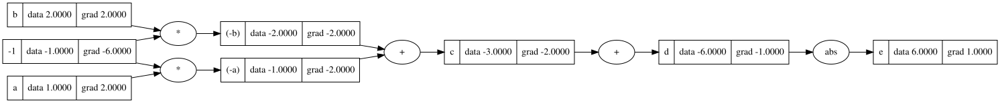

In [10]:
Value.reset()
a = Value(1, label="a")
b = Value(2, label="b")
c = -a - b; c.label = 'c'
d = - a - b + c; d.label = 'd'
e = d.abs(); e.label = 'e'
e.backward()
print(Value.values_used_so_far)
draw_computational_graph(e)

In [ ]:
Value.reset()
a = Value(1, label="a")
b = Value(2, label="b")
y = a + b + b; y.label = 'y'
y.backward()
pprint(Value.values_used_so_far)
dot = draw_computational_graph(y, rankdir="TB")
dot

In [ ]:
dot.render("repeated_node_example")

# Shapley Flow

## Helper Functions

In [ ]:
def get_function_arguments(func):
    # Get the signature of the function
    signature = inspect.signature(func)
    # Extract the parameters and convert them to a list of strings
    return [param.name for param in signature.parameters.values()]


def populate_dataframe(df, AI_DARWIN_function):
    """Populates a dataframe with every intermediate term in an AI-Darwin equation"""
    input_var_names = get_function_arguments(AI_DARWIN_function)
    print(input_var_names)
    # Iterate through each row in df
    for index, row in df.iterrows():
        input_vars = list(row[input_var_names])
        input_kwargs = {name: var for name, var in zip(input_var_names, input_vars)}

        y = AI_DARWIN_function(**input_kwargs)

        # Iterate through nodes topological sorted ordering
        for node in topo_sort(y):
            # Fill out each intermediate term (node) in the dataframe
            df.at[index, node.label] = node.data

In [ ]:
def op_to_function(op):
    """Takes an operation and turns it into its respective expression/function.

    NOTE: This function should be updated to include more operations as needed.
    """
    def add(a, b):
        return a + b

    def mul(a, b):
        return a * b

    def exp(a):
        return np.exp(a)

    def pow(a, exponent):
        return a ** exponent

    if op == '+':
        return add
    elif op == '*':
        return mul
    elif op.startswith("**"):
        exponent = int(op[2:])
        return partial(pow, exponent=exponent)
    elif op == 'exp':
        return exp
    else:
        raise NotImplementedError(f"operation {op} is not implemented.")


def build_causal_graph(root, df, target_name, debug=False):
    """
    Insert description here
    """
    causal_links = CausalLinks()
    nodes, edges = trace(root)

    for n in nodes:
        # if has an '_op' field, then n has a parent node, which means there is a causal link that needs to be added
        if n._op:
            parents = list(n._prev)
            parent_labels = [parent.label for parent in parents]
            f = op_to_function(n._op)

            # Case where binary operation x+x or x*x is performed. Since both sides of the operation are equal, we need to handle this case differently to ensure that the the correct number of causes and effects are in the causal graph.
            if len(parent_labels) < 2 and type(f) == types.FunctionType:
                if f.__name__ == 'mul':
                    f = lambda a: a*a
                elif f.__name__ == "add":
                    f = lambda a: a+a

            causal_links.add_causes_effects(parent_labels, n.label, f)
            if debug:
                print(parent_labels)
                print(parent_labels, n.label)
                print(f)
                print('\n')
    print(causal_links.items)
    causal_graph = build_feature_graph(df.fillna(df.mean()), causal_links, target_name=target_name)
    return causal_graph

In [ ]:
a = ['a']
a *= 2
a

['a', 'a']

## Sanity Check

### Equation

In [ ]:
def sanity_check_fn(x1, x2):
    Value.reset()

    x1 = Value(x1, label='x1')
    x2 = Value(x2, label='x2')

    y = x1 + x2 + x1*x2
    y.label = 'y'

    return y

In [ ]:
N = 100
# x1 = np.random.randn(N)
# x2 = np.random.randn(N)
x1 = np.random.randn(2)
x2 = np.random.randn(2)

# Set the first two indices to our foreground and background sample, (0, 0) and (1, 1), respectively
x1[0] = 0
x2[0] = 2
x1[1] = 1
x2[1] = 1

X = pd.DataFrame.from_dict({'x1': x1, 'x2': x2})
f = lambda x: x[:,0] + x[:,1] + x[:,0]*x[:,1]
f_d = pd.DataFrame.from_dict({'f': list(f(np.array(X)))})
pd.concat((X, f_d), axis=1)

,x1,x2,f
0,0.0,2.0,2.0
1,1.0,1.0,3.0


In [ ]:
populate_dataframe(X, sanity_check_fn)
X

['x1', 'x2']


,x1,x2,(x2*x1),(x1+x2),y
0,0.0,2.0,0.0,2.0,2.0
1,1.0,1.0,1.0,2.0,3.0


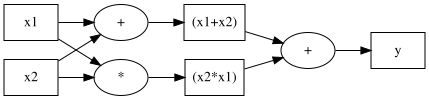

In [ ]:
Value.reset()

y = sanity_check_fn(0.1, 0.1)
target_name = 'y'

computational_graph = draw_computational_graph(y, disable_data_field=True, disable_grad_field=True)
computational_graph

[(['x2', 'x1'], ['(x2*x1)'], [<function op_to_function.<locals>.mul at 0x79a4e71a36d0>]), (['(x2*x1)', '(x1+x2)'], ['y'], [<function op_to_function.<locals>.add at 0x79a4e71a3400>]), (['x2', 'x1'], ['(x1+x2)'], [<function op_to_function.<locals>.add at 0x79a4e71a31c0>])]


0it [00:00, ?it/s]


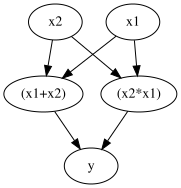

In [ ]:
Value.reset()

y = sanity_check_fn(0.1, 0.1)
target_name = 'y'


causal_graph = build_causal_graph(y, X.drop(columns=['y']), target_name)
causal_graph.draw(rankdir='TB')

In [ ]:

# nsamples = 1 # number of foreground samples to explain
nruns = 10000 # number of monte carlo samples
sample_ind = 0
bg = X[:1] # background sample, no need for multiple sample because of the linearity axiom
fg = X[1:2] # foreground samples to explain

bruteforce sampling: 100%|██████████| 10000/10000 [00:02<00:00, 3631.93it/s]


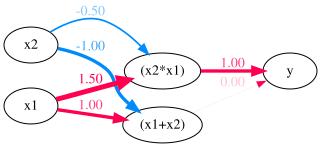

In [ ]:
cf_flow = GraphExplainer(causal_graph, bg, nruns=nruns).shap_values(fg, rankdir='LR')
cf_flow.fold_noise = True
shapflow_graph = cf_flow.draw(sample_ind, show_fg_val=False)

In [ ]:
# Save each graph
computational_graph.render('sanity_check_graph', format='png')
causal_graph.to_graphviz(rankdir='LR').draw(path='sanity_check_causal_graph.png', format='png', prog='dot')
shapflow_graph.draw(path='sanity_check_shapflow_graph.png', format='png', prog='dot')

## Reversible Reaction

In [ ]:
def reversible_reaction_fn(x1, x2):
    Value.reset()

    beta_1 = Value(2, label='beta_1')
    beta_2 = Value(3, label='beta_2')

    x1 = Value(x1, label='x1')
    x2 = Value(x2, label='x2')

    y = beta_1 * x1 - beta_2 * x2**2
    y.label = 'y'

    return y

Value(data=-10, grad=0, label=y)

In [ ]:
x1 = np.random.randn(2)
x2 = np.random.randn(2)

# Set the first two indices to our foreground and background sample
x1[0] = 0
x2[0] = 2
x1[1] = 1
x2[1] = 1

X = pd.DataFrame.from_dict({'x1': x1, 'x2': x2})
f = lambda x: x[:,0] + x[:,1] + x[:,0]*x[:,1]
f_d = pd.DataFrame.from_dict({
    'f': [
        reversible_reaction_fn(x1[0], x2[0]).data,
        reversible_reaction_fn(x1[1], x2[1]).data,
    ]
})
pd.concat((X, f_d), axis=1)

,x1,x2,f
0,0.0,2.0,-12.0
1,1.0,1.0,-1.0


In [ ]:
populate_dataframe(X, reversible_reaction_fn)
X

['x1', 'x2']


,x1,x2,beta_2,(x2**2),((x2**2)*beta_2),-1,(-((x2**2)*beta_2)),beta_1,(x1*beta_1),y
0,0.0,2.0,3.0,4.0,12.0,-1.0,-12.0,2.0,0.0,-12.0
1,1.0,1.0,3.0,1.0,3.0,-1.0,-3.0,2.0,2.0,-1.0


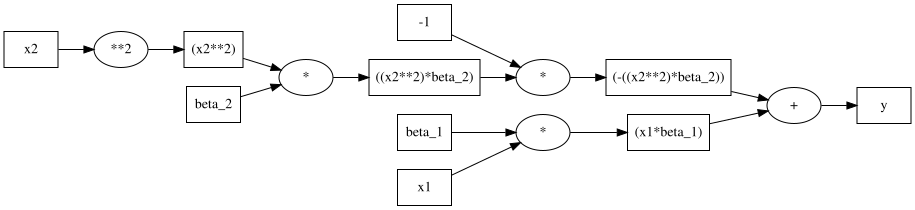

In [ ]:
Value.reset()

y = reversible_reaction_fn(0.1, 0.1)
target_name = 'y'

computational_graph = draw_computational_graph(y, disable_data_field=True, disable_grad_field=True)
computational_graph

[(['(-((x2**2)*beta_2))', '(x1*beta_1)'], ['y'], [<function op_to_function.<locals>.add at 0x7f8ce5556440>]), (['(x2**2)', 'beta_2'], ['((x2**2)*beta_2)'], [<function op_to_function.<locals>.mul at 0x7f8ce4f92290>]), (['x2'], ['(x2**2)'], [functools.partial(<function op_to_function.<locals>.pow at 0x7f8ce4f92440>, exponent=2)]), (['((x2**2)*beta_2)', '-1'], ['(-((x2**2)*beta_2))'], [<function op_to_function.<locals>.mul at 0x7f8ce4f920e0>]), (['beta_1', 'x1'], ['(x1*beta_1)'], [<function op_to_function.<locals>.mul at 0x7f8ce4f923b0>])]


0it [00:00, ?it/s]


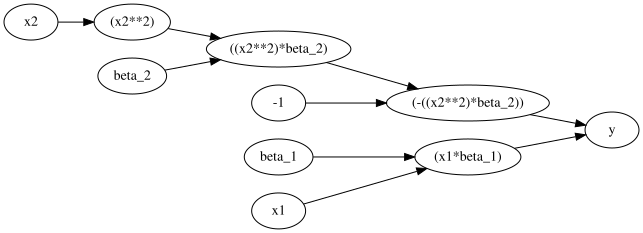

In [ ]:
Value.reset()

y = reversible_reaction_fn(0.1, 0.1)
target_name = 'y'

causal_graph = build_causal_graph(y, X.drop(columns=['y']), target_name)
causal_graph.draw(rankdir='LR')

bruteforce sampling: 100%|██████████| 10000/10000 [00:03<00:00, 2744.62it/s]


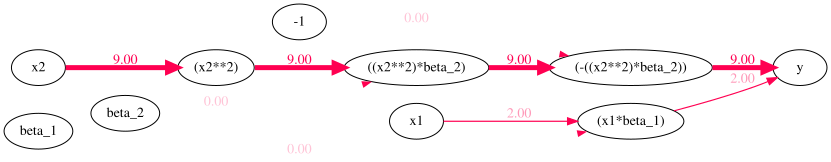

In [ ]:
nruns = 10000 # number of monte carlo samples
sample_ind = 0
bg = X[:1] # background sample, no need for multiple sample because of the linearity axiom
fg = X[1:2] # foreground samples to explain

cf_flow = GraphExplainer(causal_graph, bg, nruns=nruns).shap_values(fg, rankdir='LR')
cf_flow.fold_noise = True
shapflow_graph = cf_flow.draw(sample_ind, show_fg_val=False)

In [ ]:
# Save each graph
computational_graph.render('reversible_reaction_graph', format='png')
causal_graph.to_graphviz(rankdir='LR').draw(path='reversible_reaction_causal_graph.png', format='png', prog='dot')
shapflow_graph.draw(path='reversible_reaction_shapflow_graph.png', format='png', prog='dot')

## Bubble Column

### Import Bubble Column Data

In [ ]:
file_path = '/content/drive/MyDrive/Research/BubbleCol_Data.csv'

# Read the CSV file into a Pandas DataFrame
df = pd.read_csv(file_path)

# Delete unused vars
df.drop(labels=['PI1', 'kla'], axis=1, inplace=True)

# Standardize columns using z-score normalization
df = (df - df.mean()) / df.std()

df[:5]

,F1,F2,CT1,TI1,eps
0,-0.962129,-2.130736,-0.521895,1.679908,-0.988603
1,-0.962129,-2.130736,-0.521809,1.679803,-0.988603
2,-0.962129,-2.130736,-0.521369,1.679855,-0.988603
3,-0.962129,-2.130736,-0.521286,1.679581,-0.988603
4,-0.962129,-2.130736,-0.521493,1.679709,-0.988603


### Populate Dataframe

In [ ]:
def bubble_column_function(F1, F2, CT1, TI1, eps):
    Value.reset()

    # input variables
    F1      = Value(F1,             label='F1')
    F2      = Value(F2,             label='F2')
    CT1     = Value(CT1,            label='CT1')
    TI1     = Value(TI1,            label='TI1')
    eps     = Value(eps,            label='eps')

    # constants
    beta1   = Value(2.46291931e-3,   label='beta1')
    beta2   = Value(-6.61433312e-3,  label='beta2')
    beta3   = Value(-6.94002147e-14, label='beta3')
    beta4   = Value(-9.27760379e-3,  label='beta4')
    beta5   = Value(1.91506225e-2,   label='beta5')
    beta6   = Value(2.45071406e-2,   label='beta6')
    beta7   = Value(2.12414598e-2,   label='beta7')
    beta8   = Value(1.65748224e-2,   label='beta8')
    beta9   = Value(-1.65516588e-3,  label='beta9')
    b       = Value(0.08418511,       label='b')

    # f terms
    f1      = beta1 * (TI1)**2                ; f1.label = 'f1'
    f2      = beta2 * (-TI1)**2*(-F1)**2      ; f2.label = 'f2'
    f3      = beta3 * (-F1)/(eps)**2          ; f3.label = 'f3'
    f4      = beta4 * (-CT1)*(-F1)**2         ; f4.label = 'f4'
    f5      = beta5 * (-CT1)*(-F1)            ; f5.label = 'f5'
    f6      = beta6 * (F1)**2/(F1)            ; f6.label = 'f6'
    f7      = beta7 * (F2)                    ; f7.label = 'f7'
    f8      = beta8 * (-eps)*(CT1)            ; f8.label = 'f8'
    f9      = beta9 * (F1)*(-F2)**2*(F2)**2   ; f9.label = 'f9'

    y = f1 + f2 + f3 + f4 + f5 + f6 + f7 + f8 + f9 + b  ; y.label  = 'y'

    return y

In [ ]:
'''
This cell is computationally very intensive. Only run if there is not already an existing dataframe with the populated bubble column data.
'''
populate_dataframe(df, bubble_column_function)
df

['F1', 'F2', 'CT1', 'TI1', 'eps']


,F1,F2,CT1,TI1,eps,beta7,f7,(F1**2),beta6,((F1**2)*beta6),...,(F2**2),beta9,(F1*beta9),(-F2),((-F2)**2),(((-F2)**2)*(F1*beta9)),f9,((((((((f1+f2)+f3)+f4)+f5)+f6)+f7)+f8)+f9),b,y
0,-0.962129,-2.130736,-0.521895,1.679908,-0.988603,0.021241,-0.04526,0.925692,0.024507,0.022686,...,4.540036,-0.001655,0.001592,2.130736,4.540036,0.007230,0.032824,-0.049761,0.084185,0.034424
1,-0.962129,-2.130736,-0.521809,1.679803,-0.988603,0.021241,-0.04526,0.925692,0.024507,0.022686,...,4.540036,-0.001655,0.001592,2.130736,4.540036,0.007230,0.032824,-0.049759,0.084185,0.034426
2,-0.962129,-2.130736,-0.521369,1.679855,-0.988603,0.021241,-0.04526,0.925692,0.024507,0.022686,...,4.540036,-0.001655,0.001592,2.130736,4.540036,0.007230,0.032824,-0.049757,0.084185,0.034428
3,-0.962129,-2.130736,-0.521286,1.679581,-0.988603,0.021241,-0.04526,0.925692,0.024507,0.022686,...,4.540036,-0.001655,0.001592,2.130736,4.540036,0.007230,0.032824,-0.049753,0.084185,0.034432
4,-0.962129,-2.130736,-0.521493,1.679709,-0.988603,0.021241,-0.04526,0.925692,0.024507,0.022686,...,4.540036,-0.001655,0.001592,2.130736,4.540036,0.007230,0.032824,-0.049756,0.084185,0.034429
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90541,-0.962028,-2.130736,1.331211,-0.479731,-0.988603,0.021241,-0.04526,0.925498,0.024507,0.022681,...,4.540036,-0.001655,0.001592,2.130736,4.540036,0.007229,0.032821,-0.028140,0.084185,0.056045
90542,-0.962035,-2.130736,1.331211,-0.479731,-0.988603,0.021241,-0.04526,0.925511,0.024507,0.022682,...,4.540036,-0.001655,0.001592,2.130736,4.540036,0.007229,0.032821,-0.028140,0.084185,0.056045
90543,-0.962041,-2.130736,1.331211,-0.479731,-0.988603,0.021241,-0.04526,0.925522,0.024507,0.022682,...,4.540036,-0.001655,0.001592,2.130736,4.540036,0.007229,0.032821,-0.028140,0.084185,0.056045
90544,-0.962046,-2.130736,1.331211,-0.479731,-0.988603,0.021241,-0.04526,0.925533,0.024507,0.022682,...,4.540036,-0.001655,0.001592,2.130736,4.540036,0.007229,0.032821,-0.028140,0.084185,0.056045


In [ ]:
pprint(df.keys())

Index(['F1', 'F2', 'CT1', 'TI1', 'eps', 'beta7', 'f7', '(F1**2)', 'beta6',
       '((F1**2)*beta6)', '(F1**-1)', 'f6', '-1', '(-CT1)', 'beta5',
       '((-CT1)*beta5)', '(-F1)', 'f5', 'beta3', '((-F1)*beta3)', '(eps**2)',
       '((eps**2)**-1)', 'f3', '((-F1)**2)', 'beta2', '(-TI1)', '((-TI1)**2)',
       '(((-TI1)**2)*beta2)', 'f2', 'beta1', '(TI1**2)', 'f1', '(f1+f2)',
       '((f1+f2)+f3)', 'beta4', '((-CT1)*beta4)', 'f4', '(((f1+f2)+f3)+f4)',
       '((((f1+f2)+f3)+f4)+f5)', '(((((f1+f2)+f3)+f4)+f5)+f6)',
       '((((((f1+f2)+f3)+f4)+f5)+f6)+f7)', 'beta8', '(-eps)', '((-eps)*beta8)',
       'f8', '(((((((f1+f2)+f3)+f4)+f5)+f6)+f7)+f8)', '(F2**2)', 'beta9',
       '(F1*beta9)', '(-F2)', '((-F2)**2)', '(((-F2)**2)*(F1*beta9))', 'f9',
       '((((((((f1+f2)+f3)+f4)+f5)+f6)+f7)+f8)+f9)', 'b', 'y'],
      dtype='object')


In [ ]:
# save df as a csv
df.to_csv('bubble_column_populated_data.csv', index=False)

In [ ]:
bubble_column_populated_data_path = '/content/drive/MyDrive/Research/bubble_column_populated_data.csv'
bubble_column_populated_data = pd.read_csv(bubble_column_populated_data_path)
# Remove the target name 'y' from X because Shapley flow requires the target column to be absent
X = bubble_column_populated_data.drop(labels=['y'], axis=1)
X[:5]

,F1,F2,CT1,TI1,eps,beta7,f7,(F1**2),beta6,((F1**2)*beta6),...,(((((((f1+f2)+f3)+f4)+f5)+f6)+f7)+f8),(F2**2),beta9,(F1*beta9),(-F2),((-F2)**2),(((-F2)**2)*(F1*beta9)),f9,((((((((f1+f2)+f3)+f4)+f5)+f6)+f7)+f8)+f9),b
0,-0.962129,-2.130736,-0.521895,1.679908,-0.988603,0.021241,-0.04526,0.925692,0.024507,0.022686,...,-0.082585,4.540036,-0.001655,0.001592,2.130736,4.540036,0.00723,0.032824,-0.049761,0.084185
1,-0.962129,-2.130736,-0.521809,1.679803,-0.988603,0.021241,-0.04526,0.925692,0.024507,0.022686,...,-0.082583,4.540036,-0.001655,0.001592,2.130736,4.540036,0.00723,0.032824,-0.049759,0.084185
2,-0.962129,-2.130736,-0.521369,1.679855,-0.988603,0.021241,-0.04526,0.925692,0.024507,0.022686,...,-0.082581,4.540036,-0.001655,0.001592,2.130736,4.540036,0.00723,0.032824,-0.049757,0.084185
3,-0.962129,-2.130736,-0.521286,1.679581,-0.988603,0.021241,-0.04526,0.925692,0.024507,0.022686,...,-0.082577,4.540036,-0.001655,0.001592,2.130736,4.540036,0.00723,0.032824,-0.049753,0.084185
4,-0.962129,-2.130736,-0.521493,1.679709,-0.988603,0.021241,-0.04526,0.925692,0.024507,0.022686,...,-0.082580,4.540036,-0.001655,0.001592,2.130736,4.540036,0.00723,0.032824,-0.049756,0.084185


#### Graph kla time dependency

In [ ]:
path = '/content/drive/MyDrive/Research/BubbleCol_Data_WithTimestamp.csv'
X_with_timestamp = pd.read_csv(path)
X_with_timestamp[:5]

,Timestamp,kla,F1,F2,CT1,TI1,PI1,eps
0,0,0.020615,0.0,0.0,1.407795,23.564604,0.214363,0.0
1,2,0.020615,0.0,0.0,1.408442,23.564396,0.214366,0.0
2,4,0.020615,0.0,0.0,1.411740,23.564499,0.214353,0.0
3,6,0.020615,0.0,0.0,1.412369,23.563961,0.214363,0.0
4,8,0.020615,0.0,0.0,1.410815,23.564213,0.215173,0.0


<Axes: xlabel='Timestamp'>

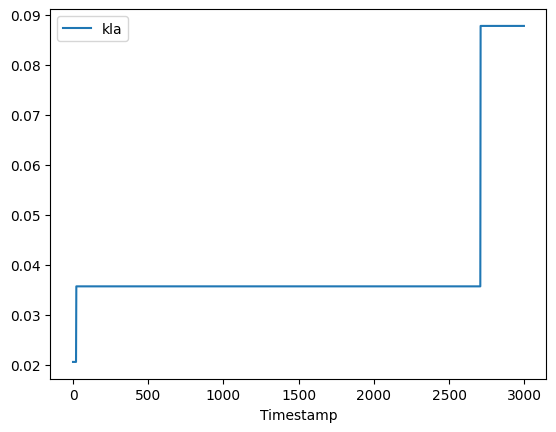

In [ ]:
# Graph X_with_timestamp with the column Timestamp as the x axis and column kla as the y-axis
X_with_timestamp[:1500].plot(x='Timestamp', y='kla')

<Axes: xlabel='Timestamp'>

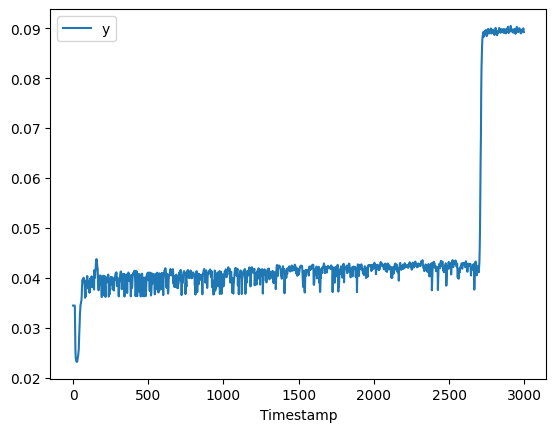

In [ ]:
bubble_column_populated_data['Timestamp'] = X_with_timestamp['Timestamp'].values

bubble_column_populated_data[:1500].plot(x='Timestamp', y='y')

### Apply Shapley Flow

0it [00:00, ?it/s]


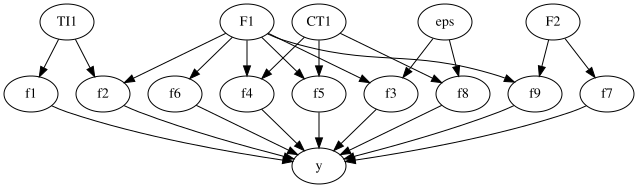

bruteforce sampling: 100%|██████████| 100/100 [00:00<00:00, 565.77it/s]


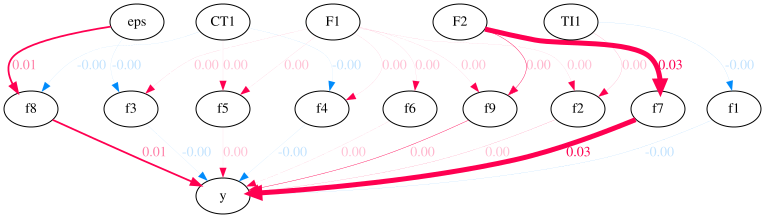

In [ ]:
# SIMPLIFIED SHAPFLOW WITH MINIMAL TERMS

# constants
beta1   = 2.46291931e-3
beta2   = -6.61433312e-3
beta3   = -6.94002147e-14
beta4   = -9.27760379e-3
beta5   = 1.91506225e-2
beta6   = 2.45071406e-2
beta7   = 2.12414598e-2
beta8   = 1.65748224e-2
beta9   = -1.65516588e-3
b       = 0.08418511


# f terms
# f1      = beta1 * (TI1)**2
# f2      = beta2 * (-TI1)**2*(-F1)**2
# f3      = beta3 * (-F1)/(eps)**2
# f4      = beta4 * (-CT1)*(-F1)**2
# f5      = beta5 * (-CT1)*(-F1)
# f6      = beta6 * (F1)**2/(F1)
# f7      = beta7 * (F2)
# f8      = beta8 * (-eps)*(CT1)
# f9      = beta9 * (F1)*(-F2)**2*(F2)**2

causal_links = CausalLinks()
target_name = 'y'
feature_names = list(X.columns)
X_with_only_f_terms = X[['F1', 'F2', 'CT1', 'TI1', 'eps', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9']]
causal_links.add_causes_effects(
    ['f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9'],
    target_name,
    lambda *args: sum(args) + b,
)
causal_links.add_causes_effects(['TI1'], ['f1'], lambda TI1: beta1 * (TI1)**2)
causal_links.add_causes_effects(['TI1', 'F1'], ['f2'], lambda TI1, F1 : beta2 * (-TI1)**2*(-F1)**2)
causal_links.add_causes_effects(['F1', 'eps'], ['f3'], lambda F1, eps : beta3 * (-F1)/(eps)**2)
causal_links.add_causes_effects(['CT1', 'F1'], ['f4'], lambda CT1, F1 : beta4 * (-CT1)*(-F1)**2)
causal_links.add_causes_effects(['CT1', 'F1'], ['f5'], lambda CT1, F1 : beta5 * (-CT1)*(-F1))
causal_links.add_causes_effects(['F1'], ['f6'], lambda F1 : beta6 * (F1)**2/(F1))
causal_links.add_causes_effects(['F2'], ['f7'], lambda F2 : beta7 * (F2))
causal_links.add_causes_effects(['eps', 'CT1'], ['f8'], lambda eps, CT1 : beta8 * (-eps)*(CT1))
causal_links.add_causes_effects(['F1', 'F2'], ['f9'], lambda F1, F2 : beta9 * (F1)*(-F2)**2*(F2)**2)

causal_graph = build_feature_graph(X_with_only_f_terms, causal_links, target_name=target_name)
causal_graph.draw(rankdir='TB')

nruns = 100
sample_ind = 0
bg = X_with_only_f_terms.iloc[1241:1242]
fg = X_with_only_f_terms.iloc[1361:1362]

cf_flow = GraphExplainer(causal_graph, bg, nruns=nruns).shap_values(fg, rankdir='TB')

cf_flow.fold_noise = True
g = cf_flow.draw(sample_ind, show_fg_val=False)#, rankdir='TB')
g.draw('shapflow_bubble_column_with_only_f_terms.png', prog='dot', format='png')

In [ ]:
# save graphs
causal_graph.to_graphviz(rankdir='TB').draw(path='bubble_column_causal_graph.png', format='png', prog='dot')
g.draw('bubble_column_shapflow_graph.png', prog='dot', format='png')

[(['(eps**2)'], ['((eps**2)**-1)'], [functools.partial(<function op_to_function.<locals>.pow at 0x7b34bc806440>, exponent=-1)]), (['-1', 'TI1'], ['(-TI1)'], [<function op_to_function.<locals>.mul at 0x7b34bc806320>]), (['(-TI1)'], ['((-TI1)**2)'], [functools.partial(<function op_to_function.<locals>.pow at 0x7b34bc806560>, exponent=2)]), (['beta9', 'F1'], ['(F1*beta9)'], [<function op_to_function.<locals>.mul at 0x7b34bc806290>]), (['((eps**2)**-1)', '((-F1)*beta3)'], ['f3'], [<function op_to_function.<locals>.mul at 0x7b34bc8064d0>]), (['(-F1)'], ['((-F1)**2)'], [functools.partial(<function op_to_function.<locals>.pow at 0x7b34bc806710>, exponent=2)]), (['((-F1)**2)', '(((-TI1)**2)*beta2)'], ['f2'], [<function op_to_function.<locals>.mul at 0x7b34bc8063b0>]), (['-1', 'CT1'], ['(-CT1)'], [<function op_to_function.<locals>.mul at 0x7b34bc806680>]), (['(TI1**2)', 'beta1'], ['f1'], [<function op_to_function.<locals>.mul at 0x7b34bc8065f0>]), (['beta6', '(F1**2)'], ['((F1**2)*beta6)'], [<f

0it [00:00, ?it/s]


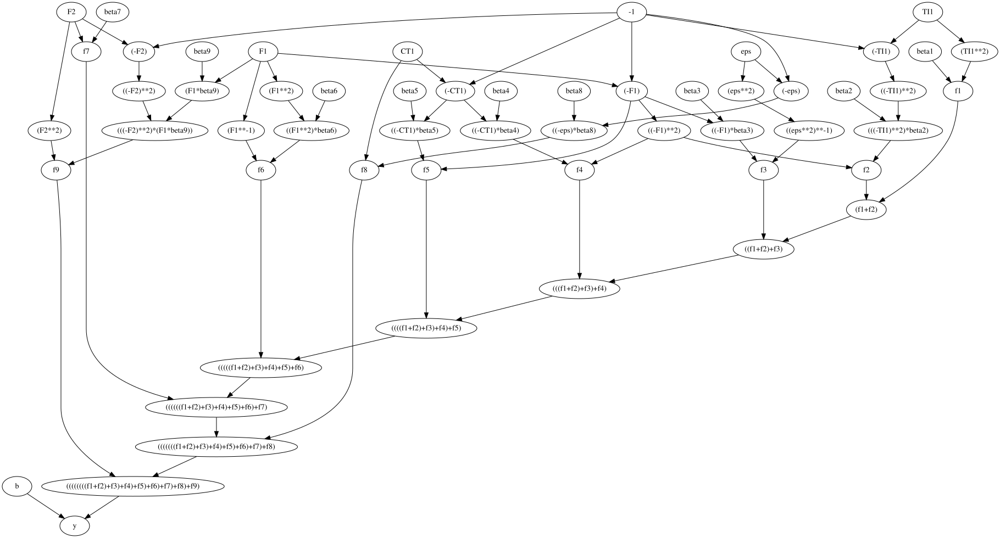

In [ ]:
y = bubble_column_function(0.1, 0.1, 0.1, 0.1, 0.1)
target_name = 'y'


causal_graph = build_causal_graph(y, X, target_name)
causal_graph.draw(rankdir='TB')

In [ ]:
# nsamples = 100 # number of foreground samples to explain
nruns = 100 # number of monte carlo samples
sample_ind = 0

# set bg to the 1243th row of bubble column spreadsheet. We index at 1241 because X is 0-indexed and the first row of the spreadsheet just has column names. Thus, our index is offset by -2.
bg = X.iloc[1241:1242]

# set fg to the 1363rd row of bubble column spreadsheet. We index at 1361 for the same reason as bg
fg = X.iloc[1361:1362]

# NOTE: we select specifically these two points as our background and foreground because the bubble column kla value massively changes between these two points.

In [ ]:
cf_flow = GraphExplainer(causal_graph, bg, nruns=nruns).shap_values(fg, rankdir='LR')

bruteforce sampling: 100%|██████████| 100/100 [00:00<00:00, 122.49it/s]


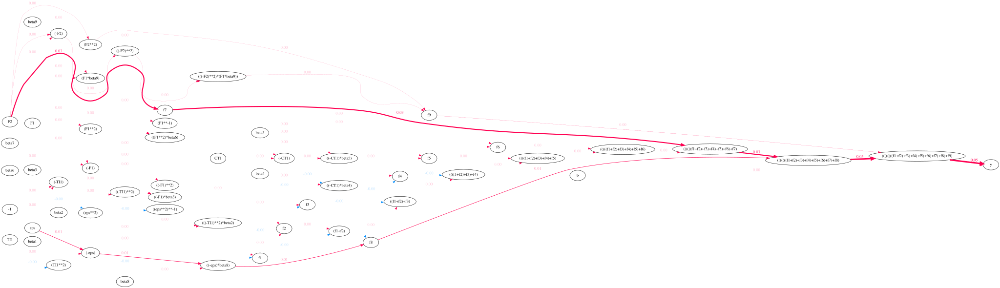

In [ ]:
cf_flow.fold_noise = True
g = cf_flow.draw(sample_ind, show_fg_val=False)#, rankdir='TB')

In [ ]:
print(type(g))
g.draw('shapflow_bubble_column.png', prog='dot', format='png')

<class 'pygraphviz.agraph.AGraph'>


#### Sample from ShapFlow GitHub

In [ ]:
np.random.seed(42)

In [ ]:
n = 100
x1 = np.random.randn(n)
x4 = x3 = x2 = x1

X = pd.DataFrame.from_dict({'X1': x1, 'X2': x2, 'X3': x3, 'X4': x4}).loc[:, ['X1', 'X2', 'X3', 'X4']]
f = lambda x: x[:, 3] # f only depend on X4
f_d = pd.DataFrame.from_dict({'f': list(f(np.array(X)))})
pd.concat((X, f_d), axis=1)

,X1,X2,X3,X4,f
0,0.496714,0.496714,0.496714,0.496714,0.496714
1,-0.138264,-0.138264,-0.138264,-0.138264,-0.138264
2,0.647689,0.647689,0.647689,0.647689,0.647689
3,1.523030,1.523030,1.523030,1.523030,1.523030
4,-0.234153,-0.234153,-0.234153,-0.234153,-0.234153
...,...,...,...,...,...
95,-1.463515,-1.463515,-1.463515,-1.463515,-1.463515
96,0.296120,0.296120,0.296120,0.296120,0.296120
97,0.261055,0.261055,0.261055,0.261055,0.261055
98,0.005113,0.005113,0.005113,0.005113,0.005113


['X1', 'X2', 'X3', 'X4']


0it [00:00, ?it/s]


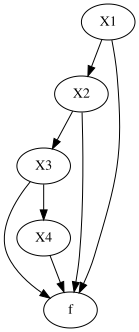

In [ ]:
causal_links = CausalLinks()
target_name = 'f'
feature_names = list(X.columns)
print(feature_names)

# build causal links
causal_links.add_causes_effects(feature_names, target_name, lambda *args: f(np.vstack(args).T))
causal_links.add_causes_effects('X1', 'X2', lambda x: x)
causal_links.add_causes_effects('X2', 'X3', lambda x: x)
causal_links.add_causes_effects('X3', 'X4', lambda x: x)
causal_graph = build_feature_graph(X.fillna(X.mean()), causal_links, target_name=target_name)

causal_graph.draw(rankdir='TB')

In [ ]:
nsamples = 100 # number of foreground samples to explain
nruns = 100 # number of monte carlo samples
sample_ind = 1
bg = X.fillna(X.mean()).sample(1) # background sample, no need for multiple sample because of the linearity axiom
fg = X[:nsamples] # foreground samples to explain

bruteforce sampling: 100%|██████████| 100/100 [00:00<00:00, 5068.58it/s]

Shapley Flow


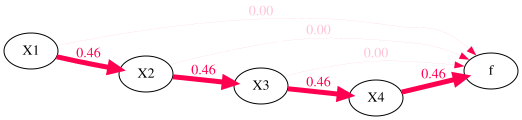

In [ ]:
cf_flow = GraphExplainer(causal_graph, bg, nruns=nruns).shap_values(fg, rankdir='LR')
print('Shapley Flow')
cf_flow.fold_noise = True
g = cf_flow.draw(sample_ind, show_fg_val=False)

## CO2

### Equation

In [ ]:
def co2_323_function(
        P, density, spg, volume, SiOSi_average, SiOSi_gmean, SiOSi_hmean, SiOSi_max, SiOSi_mean, SiOSi_min,
        SiOSi_skew, SiOSi_std, SiOSi_var, SiO_average, SiO_gmean, SiO_hmean, SiO_max, SiO_mean, SiO_min,
        SiO_skew, SiO_std, SiO_var, ASA, AV, NASA, NAV, VolFrac, largest_free_sphere, largest_included_sphere,
        largest_included_sphere_free, max_dim, min_dim, mode_dim, pld, lcd, void_frac, surf_area_m2g, surf_area_m2cm3
    ):
    Value.reset()

    # input variables
    P = Value(P, label='P')
    density = Value(density, label='density')
    spg = Value(spg, label='spg')
    volume = Value(volume, label='volume')
    SiOSi_average = Value(SiOSi_average, label='SiOSi_average')
    SiOSi_gmean = Value(SiOSi_gmean, label='SiOSi_gmean')
    SiOSi_hmean = Value(SiOSi_hmean, label='SiOSi_hmean')
    SiOSi_max = Value(SiOSi_max, label='SiOSi_max')
    SiOSi_mean = Value(SiOSi_mean, label='SiOSi_mean')
    SiOSi_min = Value(SiOSi_min, label='SiOSi_min')
    SiOSi_skew = Value(SiOSi_skew, label='SiOSi_skew')
    SiOSi_std = Value(SiOSi_std, label='SiOSi_std')
    SiOSi_var = Value(SiOSi_var, label='SiOSi_var')
    SiO_average = Value(SiO_average, label='SiO_average')
    SiO_gmean = Value(SiO_gmean, label='SiO_gmean')
    SiO_hmean = Value(SiO_hmean, label='SiO_hmean')
    SiO_max = Value(SiO_max, label='SiO_max')
    SiO_mean = Value(SiO_mean, label='SiO_mean')
    SiO_min = Value(SiO_min, label='SiO_min')
    SiO_skew = Value(SiO_skew, label='SiO_skew')
    SiO_std = Value(SiO_std, label='SiO_std')
    SiO_var = Value(SiO_var, label='SiO_var')
    ASA = Value(ASA, label='ASA')
    AV = Value(AV, label='AV')
    NASA = Value(NASA, label='NASA')
    NAV = Value(NAV, label='NAV')
    VolFrac = Value(VolFrac, label='VolFrac')
    largest_free_sphere = Value(largest_free_sphere, label='largest_free_sphere')
    largest_included_sphere = Value(largest_included_sphere, label='largest_included_sphere')
    largest_included_sphere_free = Value(largest_included_sphere_free, label='largest_included_sphere_free')
    max_dim = Value(max_dim, label='max_dim')
    min_dim = Value(min_dim, label='min_dim')
    mode_dim = Value(mode_dim, label='mode_dim')
    pld = Value(pld, label='pld')
    lcd = Value(lcd, label='lcd')
    void_frac = Value(void_frac, label='void_frac')
    surf_area_m2g = Value(surf_area_m2g, label='surf_area_m2g')
    surf_area_m2cm3 = Value(surf_area_m2cm3, label='surf_area_m2cm3')

    # constants
    beta1     = Value(2.491214660055224, label='beta1')
    beta2     = Value(-1.5263000635855446, label='beta2')
    beta3     = Value(-2.380734070171069, label='beta3')
    beta4     = Value(-9.472686455629983e-06, label='beta4')
    beta5     = Value(2.7272349373873714, label='beta5')
    beta6     = Value(-1.110269543429511, label='beta6')
    beta7     = Value(4.598133904458434, label='beta7')
    beta8     = Value(0.41918467042671564, label='beta8')
    beta9     = Value(1.3561371522860057, label='beta9')
    beta10    = Value(0.25063623373894434, label='beta10')
    beta11    = Value(2.3446256051528107, label='beta11')
    beta12    = Value(1.4145370797433214, label='beta12')
    beta13    = Value(1.332332199550355, label='beta13')
    beta14    = Value(-5.517880398071334, label='beta14')
    intercept = Value(0.0, label='intercept')

    # f terms
    f1 = (-pld).exp()*(-density).exp()/((void_frac)**2); f1.label = "f1"
    f2 = ((-NASA).exp())**2/largest_free_sphere.exp(); f2.label = "f2"
    f3 = 1/(-density).exp()/((surf_area_m2g)**2); f3.label = "f3"
    f4 = (-surf_area_m2cm3).exp()/((AV)**3)*void_frac.exp(); f4.label = "f4"
    f5 = (-largest_included_sphere_free).exp()*(-pld).exp()/((NAV)**2); f5.label = "f5"
    f6 = 1/(-largest_included_sphere_free).exp()/((void_frac)**2); f6.label = "f6"
    f7 = 1/(-VolFrac).exp()/((NAV)**2); f7.label = "f7"
    f8 = ASA.exp()/(-surf_area_m2g).exp(); f8.label = "f8"
    f9 = void_frac.exp()/(-spg).exp()*((NAV)**2); f9.label = "f9"
    f10 = ((NASA)**2)/NASA.exp()/((volume)**2); f10.label = "f10"
    f11 = AV.exp()/1/((surf_area_m2g)**2); f11.label = "f11"
    f12 = (-surf_area_m2cm3).exp()*pld.exp()*(-NASA).exp(); f12.label = "f12"
    f13 = ((surf_area_m2cm3)**2)*AV.exp()*((lcd)**2); f13.label = "f13"
    f14 = 1/(-surf_area_m2g).exp()/((NAV)**2); f14.label = "f14"

    y = beta1*((f1*P)/(1 + f1*P)) + beta2*((f2*P)/(1 + f2*P)) + beta3*((f3*P)/(1 + f3*P)) + beta4*((f4*P)/(1 + f4*P)) + beta5*((f5*P)/(1 + f5*P)) + beta6*((f6*P)/(1 + f6*P)) + beta7*((f7*P)/(1 + f7*P)) + beta8*((f8*P)/(1 + f8*P)) + beta9*((f9*P)/(1 + f9*P)) + beta10*((f10*P)/(1 + f10*P)) + beta11*((f11*P)/(1 + f11*P)) + beta12*((f12*P)/(1 + f12*P)) + beta13*((f13*P)/(1 + f13*P)) + beta14*((f14*P)/(1 + f14*P)) + intercept
    y.label = 'y'
    return y

In [ ]:
def co2_373_function(
        P, density, spg, volume, SiOSi_average, SiOSi_gmean, SiOSi_hmean, SiOSi_max, SiOSi_mean, SiOSi_min,
        SiOSi_skew, SiOSi_std, SiOSi_var, SiO_average, SiO_gmean, SiO_hmean, SiO_max, SiO_mean, SiO_min,
        SiO_skew, SiO_std, SiO_var, ASA, AV, NASA, NAV, VolFrac, largest_free_sphere, largest_included_sphere,
        largest_included_sphere_free, max_dim, min_dim, mode_dim, pld, lcd, void_frac, surf_area_m2g, surf_area_m2cm3
    ):
    Value.reset()

    # input variables
    P = Value(P, label='P')
    density = Value(density, label='density')
    spg = Value(spg, label='spg')
    volume = Value(volume, label='volume')
    SiOSi_average = Value(SiOSi_average, label='SiOSi_average')
    SiOSi_gmean = Value(SiOSi_gmean, label='SiOSi_gmean')
    SiOSi_hmean = Value(SiOSi_hmean, label='SiOSi_hmean')
    SiOSi_max = Value(SiOSi_max, label='SiOSi_max')
    SiOSi_mean = Value(SiOSi_mean, label='SiOSi_mean')
    SiOSi_min = Value(SiOSi_min, label='SiOSi_min')
    SiOSi_skew = Value(SiOSi_skew, label='SiOSi_skew')
    SiOSi_std = Value(SiOSi_std, label='SiOSi_std')
    SiOSi_var = Value(SiOSi_var, label='SiOSi_var')
    SiO_average = Value(SiO_average, label='SiO_average')
    SiO_gmean = Value(SiO_gmean, label='SiO_gmean')
    SiO_hmean = Value(SiO_hmean, label='SiO_hmean')
    SiO_max = Value(SiO_max, label='SiO_max')
    SiO_mean = Value(SiO_mean, label='SiO_mean')
    SiO_min = Value(SiO_min, label='SiO_min')
    SiO_skew = Value(SiO_skew, label='SiO_skew')
    SiO_std = Value(SiO_std, label='SiO_std')
    SiO_var = Value(SiO_var, label='SiO_var')
    ASA = Value(ASA, label='ASA')
    AV = Value(AV, label='AV')
    NASA = Value(NASA, label='NASA')
    NAV = Value(NAV, label='NAV')
    VolFrac = Value(VolFrac, label='VolFrac')
    largest_free_sphere = Value(largest_free_sphere, label='largest_free_sphere')
    largest_included_sphere = Value(largest_included_sphere, label='largest_included_sphere')
    largest_included_sphere_free = Value(largest_included_sphere_free, label='largest_included_sphere_free')
    max_dim = Value(max_dim, label='max_dim')
    min_dim = Value(min_dim, label='min_dim')
    mode_dim = Value(mode_dim, label='mode_dim')
    pld = Value(pld, label='pld')
    lcd = Value(lcd, label='lcd')
    void_frac = Value(void_frac, label='void_frac')
    surf_area_m2g = Value(surf_area_m2g, label='surf_area_m2g')
    surf_area_m2cm3 = Value(surf_area_m2cm3, label='surf_area_m2cm3')


    # constants
    beta1     = Value(-0.3594413972218853, label='beta1')
    beta2     = Value(0.7236283377256563, label='beta2')
    beta3     = Value(-2.491688880718375, label='beta3')
    beta4     = Value(0.09275076505414136, label='beta4')
    beta5     = Value(0.9655176044485131, label='beta5')
    beta6     = Value(6.602116824421418, label='beta6')
    beta7     = Value(-8.506535242975505e-06, label='beta7')
    beta8     = Value(-1.613293940314934, label='beta8')
    beta9     = Value(1.275887158343305, label='beta9')
    beta10    = Value(-4.973935475022366e-06, label='beta10')
    beta11    = Value(-3.3528986757269825, label='beta11')
    beta12    = Value(2.5511241106011875, label='beta12')
    beta13    = Value(0.00015360330426490517, label='beta13')
    beta14    = Value(-5.8135254289460757e-05, label='beta14')
    intercept = Value(0, label='intercept')

    # f terms
    f1 = 1/((AV)**2)*largest_included_sphere_free.exp(); f1.label = 'f1'
    f2 = ((lcd)**2)/(-surf_area_m2g).exp()/(-volume).exp(); f2.label = 'f2'
    f3 = ASA.exp()/volume.exp(); f3.label = 'f3'
    f4 = ((AV)**3)*((largest_included_sphere)**3)*1; f4.label = 'f4'
    f5 = (-largest_included_sphere_free).exp()/((AV)**2)/surf_area_m2cm3.exp(); f5.label = 'f5'
    f6 = 1/(VolFrac).exp()*void_frac.exp(); f6.label = 'f6'
    f7 = (density)/(-largest_included_sphere_free).exp()*((NASA)**3); f7.label = 'f7'
    f8 = spg.exp()*surf_area_m2g.exp(); f8.label = 'f8'
    f9 = spg.exp()/NAV.exp()/void_frac.exp(); f9.label = 'f9'
    f10 = (NASA)*((ASA)**3)/lcd.exp(); f10.label = 'f10'
    f11 = 1/(volume).exp()/AV.exp(); f11.label = 'f11'
    f12 = density.exp()*ASA.exp(); f12.label = 'f12'
    f13 = largest_included_sphere.exp()/(surf_area_m2g)*(-surf_area_m2g).exp(); f13.label = 'f13'
    f14 = (-ASA).exp()/surf_area_m2g.exp()/(largest_included_sphere_free); f14.label = 'f14'

    y = beta1*((f1*P)/(1 + f1*P)) + beta2*((f2*P)/(1 + f2*P)) + beta3*((f3*P)/(1 + f3*P)) + beta4*((f4*P)/(1 + f4*P)) + beta5*((f5*P)/(1 + f5*P)) + beta6*((f6*P)/(1 + f6*P)) + beta7*((f7*P)/(1 + f7*P)) + beta8*((f8*P)/(1 + f8*P)) + beta9*((f9*P)/(1 + f9*P)) + beta10*((f10*P)/(1 + f10*P)) + beta11*((f11*P)/(1 + f11*P)) + beta12*((f12*P)/(1 + f12*P)) + beta13*((f13*P)/(1 + f13*P)) + beta14*((f14*P)/(1 + f14*P)) + intercept
    y.label = 'y'
    return y

### Loading and accessing data

In [ ]:
co2_file_path = '/content/drive/MyDrive/Research/co2/CO2.xlsx'
# Load co2 data as a dict where the keys are the catalyst name and the values are the respective dataframes
co2: dict = pd.read_excel(co2_file_path, sheet_name=None)
P_TRAIN_STD = 1839573.4508480425 # Taken from Arijit's Jupyter Notebook where he runs AI DARWIN algo to get the final equation

catalyst_names = []
for catalyst_name, df in co2.items():
    catalyst_names.append(catalyst_name)
    # Rename columns to our variable names
    df.rename(columns={'Temperature (K)': 'temperature', 'Pressure (Pa)' : 'P'}, inplace=True)

    # Divide pressure term by P_TRAIN_STD (1839573.4508480425) to follow Arijit's methodology to generate the AI DARWIN equation
    df['P'] = df['P'] / P_TRAIN_STD

    # Split each sheet into temperature buckets
    df_grouped_by_temperature = df.groupby('temperature')
    co2[catalyst_name] = {temperature: df_group for temperature, df_group in df_grouped_by_temperature}

co2['SBS'][323]

,temperature,P,Absolute Loading (mol/kg)
9,323,0.000707,0.002791
10,323,0.002881,0.011485
11,323,0.005817,0.023076
12,323,0.011579,0.046418
13,323,0.023212,0.092538
14,323,0.046369,0.180918
15,323,0.055067,0.216516
16,323,0.144925,0.605913
17,323,0.315290,1.403177
18,323,3.533428,6.164138


In [ ]:
catalysts_file_path = '/content/drive/MyDrive/Research/co2/complete_data_avail.xlsx'
_catalysts = pd.read_excel(catalysts_file_path)

# Remove every row that contains a nan
_catalysts.dropna(inplace=True)

# Separate numeric columns from str columns to perform numeric operations
catalyst_names = _catalysts['name']
numeric_cols = _catalysts.select_dtypes(include=[np.number]).columns
_catalysts = _catalysts[numeric_cols]

# Z-score each numeric column
catalysts = _catalysts.apply(zscore)

# Insert catalyst names back numeric columns
catalysts.insert(loc=0, column='name', value=catalyst_names)

# Convert catalysts into a dictionary with catalyst name as the key and the values are the properties of the catalyst in dict format
catalysts: dict = catalysts.set_index('name').to_dict(orient='index')
catalysts['SBS']

{'density': -1.8558630932892477,
 'spg': 1.2624683088634494,
 'volume': 1.793626923931012,
 'SiOSi_average': -0.8863144687132899,
 'SiOSi_gmean': -0.8619418348316873,
 'SiOSi_hmean': -0.8373436573306983,
 'SiOSi_max': -1.3822614723202076,
 'SiOSi_mean': -0.8863144687132899,
 'SiOSi_min': -0.4294011773596648,
 'SiOSi_skew': -0.8391314491267721,
 'SiOSi_std': -1.030422199053148,
 'SiOSi_var': -0.8597443678263218,
 'SiO_average': 0.09841020073221819,
 'SiO_gmean': 0.11525976617628211,
 'SiO_hmean': 0.12315403662807878,
 'SiO_max': 0.3361714402447173,
 'SiO_mean': 0.09841020073221819,
 'SiO_min': 0.12009515640585561,
 'SiO_skew': 1.040308818872039,
 'SiO_std': -0.10976626252065085,
 'SiO_var': -0.11601125779625783,
 'ASA': 1.90937178129791,
 'AV': 2.127520986920949,
 'NASA': -0.6807185333684872,
 'NAV': -0.3361041141839826,
 'VolFrac': 2.239583324075746,
 'largest_free_sphere': 1.5469201241674324,
 'largest_included_sphere': 2.174034646928647,
 'largest_included_sphere_free': 2.24045140315

In [ ]:
missing_catalysts = set()
# Add catalyst properties to each co2 sheet
for catalyst_name, co2_grouped_by_temperature in co2.items():
    for temperature, df in co2_grouped_by_temperature.items():
        try:
            for catalyst_property in catalysts[catalyst_name]:
                co2[catalyst_name][temperature][catalyst_property] = catalysts[catalyst_name][catalyst_property]
        except KeyError: # Case where we are missing data on a given catalyst
            missing_catalysts.add(catalyst_name)

# For now, delete all co2 sheets that use a catalyst with missing data:
for catalyst_name in missing_catalysts:
    del co2[catalyst_name]

print("Missing catalysts:", list(missing_catalysts))
co2['SBS'][323]

Missing catalysts: ['CAN', 'MRE', 'FAU', 'CHA', 'AFI', 'OSO', 'JSN', 'RUT', 'MAR', 'STO', 'BEA']


,temperature,P,Absolute Loading (mol/kg),density,spg,volume,SiOSi_average,SiOSi_gmean,SiOSi_hmean,SiOSi_max,...,largest_included_sphere,largest_included_sphere_free,max_dim,min_dim,mode_dim,pld,lcd,void_frac,surf_area_m2g,surf_area_m2cm3
9,323,0.000707,0.002791,-1.855863,1.262468,1.793627,-0.886314,-0.861942,-0.837344,-1.382261,...,2.174035,2.240451,1.191537,1.234825,1.234825,1.530717,2.167132,1.788517,1.901897,1.864466
10,323,0.002881,0.011485,-1.855863,1.262468,1.793627,-0.886314,-0.861942,-0.837344,-1.382261,...,2.174035,2.240451,1.191537,1.234825,1.234825,1.530717,2.167132,1.788517,1.901897,1.864466
11,323,0.005817,0.023076,-1.855863,1.262468,1.793627,-0.886314,-0.861942,-0.837344,-1.382261,...,2.174035,2.240451,1.191537,1.234825,1.234825,1.530717,2.167132,1.788517,1.901897,1.864466
12,323,0.011579,0.046418,-1.855863,1.262468,1.793627,-0.886314,-0.861942,-0.837344,-1.382261,...,2.174035,2.240451,1.191537,1.234825,1.234825,1.530717,2.167132,1.788517,1.901897,1.864466
13,323,0.023212,0.092538,-1.855863,1.262468,1.793627,-0.886314,-0.861942,-0.837344,-1.382261,...,2.174035,2.240451,1.191537,1.234825,1.234825,1.530717,2.167132,1.788517,1.901897,1.864466
14,323,0.046369,0.180918,-1.855863,1.262468,1.793627,-0.886314,-0.861942,-0.837344,-1.382261,...,2.174035,2.240451,1.191537,1.234825,1.234825,1.530717,2.167132,1.788517,1.901897,1.864466
15,323,0.055067,0.216516,-1.855863,1.262468,1.793627,-0.886314,-0.861942,-0.837344,-1.382261,...,2.174035,2.240451,1.191537,1.234825,1.234825,1.530717,2.167132,1.788517,1.901897,1.864466
16,323,0.144925,0.605913,-1.855863,1.262468,1.793627,-0.886314,-0.861942,-0.837344,-1.382261,...,2.174035,2.240451,1.191537,1.234825,1.234825,1.530717,2.167132,1.788517,1.901897,1.864466
17,323,0.315290,1.403177,-1.855863,1.262468,1.793627,-0.886314,-0.861942,-0.837344,-1.382261,...,2.174035,2.240451,1.191537,1.234825,1.234825,1.530717,2.167132,1.788517,1.901897,1.864466
18,323,3.533428,6.164138,-1.855863,1.262468,1.793627,-0.886314,-0.861942,-0.837344,-1.382261,...,2.174035,2.240451,1.191537,1.234825,1.234825,1.530717,2.167132,1.788517,1.901897,1.864466


### Populate dataframe of computational graph

In [ ]:
# Populate every co2 eq for each catalyst at every temperature
for catalyst_name, co2_grouped_by_temperature in co2.items():
    for temperature, df in co2_grouped_by_temperature.items():
        if temperature == 323:
            populate_dataframe(df, co2_323_function)
        elif temperature == 373:
            populate_dataframe(df, co2_373_function)

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3']


<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.at[index, node.label] = node.data
<ipython-input-15-3404a99784aa>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

In [ ]:
X = co2['MFS'][373]
X

,temperature,P,Absolute Loading (mol/kg),density,spg,volume,SiOSi_average,SiOSi_gmean,SiOSi_hmean,SiOSi_max,...,((surf_area_m2g**-1)*e^(largest_included_sphere)),f13,(P*f13),((P*f13)+1),(((P*f13)+1)**-1),((((P*f13)+1)**-1)*(P*f13)),(((((P*f13)+1)**-1)*(P*f13))*beta13),(((((((((((((((((P*f1)+1)**-1)*(P*f1))*beta1)+(((((P*f2)+1)**-1)*(P*f2))*beta2))+(((((P*f3)+1)**-1)*(P*f3))*beta3))+(((((P*f4)+1)**-1)*(P*f4))*beta4))+(((((P*f5)+1)**-1)*(P*f5))*beta5))+(((((P*f6)+1)**-1)*(P*f6))*beta6))+(((((P*f7)+1)**-1)*(P*f7))*beta7))+(((((P*f8)+1)**-1)*(P*f8))*beta8))+(((((P*f9)+1)**-1)*(P*f9))*beta9))+(((((P*f10)+1)**-1)*(P*f10))*beta10))+(((((P*f11)+1)**-1)*(P*f11))*beta11))+(((((P*f12)+1)**-1)*(P*f12))*beta12))+(((((P*f13)+1)**-1)*(P*f13))*beta13)),((((((((((((((((((P*f1)+1)**-1)*(P*f1))*beta1)+(((((P*f2)+1)**-1)*(P*f2))*beta2))+(((((P*f3)+1)**-1)*(P*f3))*beta3))+(((((P*f4)+1)**-1)*(P*f4))*beta4))+(((((P*f5)+1)**-1)*(P*f5))*beta5))+(((((P*f6)+1)**-1)*(P*f6))*beta6))+(((((P*f7)+1)**-1)*(P*f7))*beta7))+(((((P*f8)+1)**-1)*(P*f8))*beta8))+(((((P*f9)+1)**-1)*(P*f9))*beta9))+(((((P*f10)+1)**-1)*(P*f10))*beta10))+(((((P*f11)+1)**-1)*(P*f11))*beta11))+(((((P*f12)+1)**-1)*(P*f12))*beta12))+(((((P*f13)+1)**-1)*(P*f13))*beta13))+(((((P*f14)+1)**-1)*(P*f14))*beta14)),y
22,373,0.000707,0.002802,0.320074,-0.676579,-0.348657,0.540045,0.565635,0.590252,-0.287646,...,-18.90416,-19.86936,-0.014041,0.985959,1.014241,-0.014241,-0.000002,0.020455,0.020456,0.020456
23,373,0.002881,0.011553,0.320074,-0.676579,-0.348657,0.540045,0.565635,0.590252,-0.287646,...,-18.90416,-19.86936,-0.057246,0.942754,1.060722,-0.060722,-0.000009,0.075738,0.075745,0.075745
24,373,0.005817,0.022938,0.320074,-0.676579,-0.348657,0.540045,0.565635,0.590252,-0.287646,...,-18.90416,-19.86936,-0.115571,0.884429,1.130674,-0.130674,-0.000020,0.136110,0.136127,0.136127
25,373,0.011579,0.045927,0.320074,-0.676579,-0.348657,0.540045,0.565635,0.590252,-0.287646,...,-18.90416,-19.86936,-0.230063,0.769937,1.298807,-0.298807,-0.000046,0.223195,0.223245,0.223245
26,373,0.023212,0.092818,0.320074,-0.676579,-0.348657,0.540045,0.565635,0.590252,-0.287646,...,-18.90416,-19.86936,-0.461206,0.538794,1.855996,-0.855996,-0.000131,0.331482,0.332165,0.332165
27,373,0.046369,0.171927,0.320074,-0.676579,-0.348657,0.540045,0.565635,0.590252,-0.287646,...,-18.90416,-19.86936,-0.921331,0.078669,12.711516,-11.711516,-0.001799,0.441340,0.441212,0.441212
28,373,0.055067,0.204187,0.320074,-0.676579,-0.348657,0.540045,0.565635,0.590252,-0.287646,...,-18.90416,-19.86936,-1.094148,-0.094148,-10.621543,11.621543,0.001785,0.472024,0.471917,0.471917
29,373,0.144925,0.504693,0.320074,-0.676579,-0.348657,0.540045,0.565635,0.590252,-0.287646,...,-18.90416,-19.86936,-2.879565,-1.879565,-0.532038,1.532038,0.000235,0.637323,0.637253,0.637253
30,373,0.315290,0.962609,0.320074,-0.676579,-0.348657,0.540045,0.565635,0.590252,-0.287646,...,-18.90416,-19.86936,-6.264620,-5.264620,-0.189947,1.189947,0.000183,0.866853,0.866790,0.866790
31,373,1.902615,2.442388,0.320074,-0.676579,-0.348657,0.540045,0.565635,0.590252,-0.287646,...,-18.90416,-19.86936,-37.803741,-36.803741,-0.027171,1.027171,0.000158,2.163539,2.163480,2.163480


<Axes: xlabel='P'>

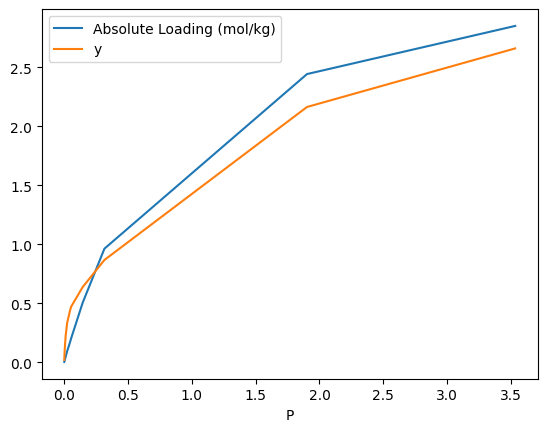

In [ ]:
# Plot the P on the x-axis and Absolute Loading (mol/kg) and y on the y-axis
X.plot(x='P', y=['Absolute Loading (mol/kg)', 'y'], kind='line')

### Apply Shapley Flow

#### Build Causal Graph

[(['(1*(e^(volume)**-1))', '(e^(AV)**-1)'], ['f11'], [<function op_to_function.<locals>.mul at 0x79a4eec00790>]), (['(1*((AV**2)**-1))', 'e^(largest_included_sphere_free)'], ['f1'], [<function op_to_function.<locals>.mul at 0x79a4eec02cb0>]), (['surf_area_m2g'], ['(surf_area_m2g**-1)'], [functools.partial(<function op_to_function.<locals>.pow at 0x79a4eec016c0>, exponent=-1)]), (['f9', 'P'], ['(P*f9)'], [<function op_to_function.<locals>.mul at 0x79a4eec039a0>]), (['f5', 'P'], ['(P*f5)'], [<function op_to_function.<locals>.mul at 0x79a4eec02200>]), (['((((((((((P*f1)+1)**-1)*(P*f1))*beta1)+(((((P*f2)+1)**-1)*(P*f2))*beta2))+(((((P*f3)+1)**-1)*(P*f3))*beta3))+(((((P*f4)+1)**-1)*(P*f4))*beta4))+(((((P*f5)+1)**-1)*(P*f5))*beta5))+(((((P*f6)+1)**-1)*(P*f6))*beta6))', '(((((P*f7)+1)**-1)*(P*f7))*beta7)'], ['(((((((((((P*f1)+1)**-1)*(P*f1))*beta1)+(((((P*f2)+1)**-1)*(P*f2))*beta2))+(((((P*f3)+1)**-1)*(P*f3))*beta3))+(((((P*f4)+1)**-1)*(P*f4))*beta4))+(((((P*f5)+1)**-1)*(P*f5))*beta5))+(((((P

0it [00:00, ?it/s]


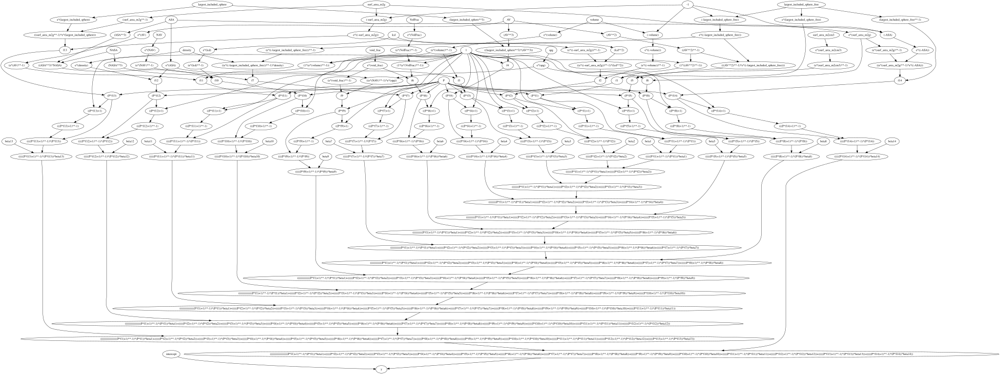

In [ ]:
Value.reset()
# Pass in arbitrary values into our function because we are just trying to construct the causal graph
y = co2_373_function(*([0.1] * len(inspect.signature(co2_373_function).parameters)))
target_name = 'y'

X = X.drop(labels=['y'], axis=1)

causal_graph = build_causal_graph(y, X, target_name, debug=False)
causal_graph.draw(rankdir='TB')

#### Holding Pressure Constant

In [ ]:
nruns = 100 # number of monte carlo samples
sample_ind = 0
random_catalyst = random.choice(list(co2.keys())) # Sample a random catalyst
bg = co2[random_catalyst][373].sample(1).drop(labels=['y'], axis=1) # background sample, no need for multiple sample because of the linearity axiom
bg_pressure_value = bg['P'].iloc[0]
fg = X[X['P'] == bg_pressure_value] # foreground samples to explain. Selecting row from X such that the pressure value is equal to the pressure value of bg
bg = bg[fg.columns] # ensure fg and bg have same column order. NOTE: this only works when there is 1 fg

In [ ]:
print(random_catalyst)
bg

SFH


,temperature,P,Absolute Loading (mol/kg),density,spg,volume,SiOSi_average,SiOSi_gmean,SiOSi_hmean,SiOSi_max,...,(e^(surf_area_m2g)**-1),((e^(surf_area_m2g)**-1)*e^((-ASA))),f14,(P*f14),((P*f14)+1),(((P*f14)+1)**-1),((((P*f14)+1)**-1)*(P*f14)),(((((P*f14)+1)**-1)*(P*f14))*beta14),((((((((((((((((((P*f1)+1)**-1)*(P*f1))*beta1)+(((((P*f2)+1)**-1)*(P*f2))*beta2))+(((((P*f3)+1)**-1)*(P*f3))*beta3))+(((((P*f4)+1)**-1)*(P*f4))*beta4))+(((((P*f5)+1)**-1)*(P*f5))*beta5))+(((((P*f6)+1)**-1)*(P*f6))*beta6))+(((((P*f7)+1)**-1)*(P*f7))*beta7))+(((((P*f8)+1)**-1)*(P*f8))*beta8))+(((((P*f9)+1)**-1)*(P*f9))*beta9))+(((((P*f10)+1)**-1)*(P*f10))*beta10))+(((((P*f11)+1)**-1)*(P*f11))*beta11))+(((((P*f12)+1)**-1)*(P*f12))*beta12))+(((((P*f13)+1)**-1)*(P*f13))*beta13))+(((((P*f14)+1)**-1)*(P*f14))*beta14)),intercept
23,373,0.144925,0.395679,-0.236092,-0.397474,0.10687,0.867193,0.829269,0.789474,0.946382,...,0.582584,0.299005,0.446122,0.064654,1.064654,0.939272,0.060728,-0.000004,0.119509,0.0


In [ ]:
fg

,temperature,P,Absolute Loading (mol/kg),density,spg,volume,SiOSi_average,SiOSi_gmean,SiOSi_hmean,SiOSi_max,...,(e^(surf_area_m2g)**-1),((e^(surf_area_m2g)**-1)*e^((-ASA))),f14,(P*f14),((P*f14)+1),(((P*f14)+1)**-1),((((P*f14)+1)**-1)*(P*f14)),(((((P*f14)+1)**-1)*(P*f14))*beta14),((((((((((((((((((P*f1)+1)**-1)*(P*f1))*beta1)+(((((P*f2)+1)**-1)*(P*f2))*beta2))+(((((P*f3)+1)**-1)*(P*f3))*beta3))+(((((P*f4)+1)**-1)*(P*f4))*beta4))+(((((P*f5)+1)**-1)*(P*f5))*beta5))+(((((P*f6)+1)**-1)*(P*f6))*beta6))+(((((P*f7)+1)**-1)*(P*f7))*beta7))+(((((P*f8)+1)**-1)*(P*f8))*beta8))+(((((P*f9)+1)**-1)*(P*f9))*beta9))+(((((P*f10)+1)**-1)*(P*f10))*beta10))+(((((P*f11)+1)**-1)*(P*f11))*beta11))+(((((P*f12)+1)**-1)*(P*f12))*beta12))+(((((P*f13)+1)**-1)*(P*f13))*beta13))+(((((P*f14)+1)**-1)*(P*f14))*beta14)),intercept
29,373,0.144925,0.504693,0.320074,-0.676579,-0.348657,0.540045,0.565635,0.590252,-0.287646,...,1.051058,0.812888,-39.70081,-5.753636,-4.753636,-0.210365,1.210365,-0.00007,0.637253,0.0


bruteforce sampling: 100%|██████████| 100/100 [00:06<00:00, 16.55it/s]


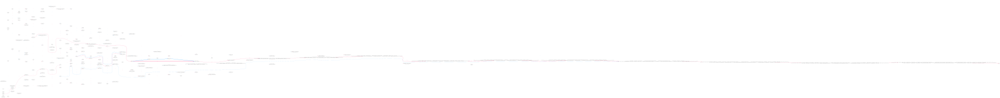

In [ ]:
cf_flow = GraphExplainer(causal_graph, bg, nruns=nruns).shap_values(fg, rankdir='LR')
cf_flow.fold_noise = True
g = cf_flow.draw(sample_ind, show_fg_val=False)#, rankdir='TB')

In [ ]:
print(type(g))
g.draw('shapflow_co2_373_LTA_to_MFS.svg', prog='dot', format='svg')

<class 'pygraphviz.agraph.AGraph'>


#### Holding Catalyst Constant

In [ ]:
nruns = 100 # number of monte carlo samples
sample_ind = 0
samples = X.sample(2)
bg = samples.iloc[0:1]
fg = samples.iloc[1:]

In [ ]:
bg

,temperature,P,Absolute Loading (mol/kg),density,spg,volume,SiOSi_average,SiOSi_gmean,SiOSi_hmean,SiOSi_max,...,(e^(surf_area_m2g)**-1),((e^(surf_area_m2g)**-1)*e^((-ASA))),f14,(P*f14),((P*f14)+1),(((P*f14)+1)**-1),((((P*f14)+1)**-1)*(P*f14)),(((((P*f14)+1)**-1)*(P*f14))*beta14),((((((((((((((((((P*f1)+1)**-1)*(P*f1))*beta1)+(((((P*f2)+1)**-1)*(P*f2))*beta2))+(((((P*f3)+1)**-1)*(P*f3))*beta3))+(((((P*f4)+1)**-1)*(P*f4))*beta4))+(((((P*f5)+1)**-1)*(P*f5))*beta5))+(((((P*f6)+1)**-1)*(P*f6))*beta6))+(((((P*f7)+1)**-1)*(P*f7))*beta7))+(((((P*f8)+1)**-1)*(P*f8))*beta8))+(((((P*f9)+1)**-1)*(P*f9))*beta9))+(((((P*f10)+1)**-1)*(P*f10))*beta10))+(((((P*f11)+1)**-1)*(P*f11))*beta11))+(((((P*f12)+1)**-1)*(P*f12))*beta12))+(((((P*f13)+1)**-1)*(P*f13))*beta13))+(((((P*f14)+1)**-1)*(P*f14))*beta14)),intercept
25,373,0.011579,0.045927,0.320074,-0.676579,-0.348657,0.540045,0.565635,0.590252,-0.287646,...,1.051058,0.812888,-39.70081,-0.459687,0.540313,1.850778,-0.850778,0.000049,0.223245,0.0


In [ ]:
fg

,temperature,P,Absolute Loading (mol/kg),density,spg,volume,SiOSi_average,SiOSi_gmean,SiOSi_hmean,SiOSi_max,...,(e^(surf_area_m2g)**-1),((e^(surf_area_m2g)**-1)*e^((-ASA))),f14,(P*f14),((P*f14)+1),(((P*f14)+1)**-1),((((P*f14)+1)**-1)*(P*f14)),(((((P*f14)+1)**-1)*(P*f14))*beta14),((((((((((((((((((P*f1)+1)**-1)*(P*f1))*beta1)+(((((P*f2)+1)**-1)*(P*f2))*beta2))+(((((P*f3)+1)**-1)*(P*f3))*beta3))+(((((P*f4)+1)**-1)*(P*f4))*beta4))+(((((P*f5)+1)**-1)*(P*f5))*beta5))+(((((P*f6)+1)**-1)*(P*f6))*beta6))+(((((P*f7)+1)**-1)*(P*f7))*beta7))+(((((P*f8)+1)**-1)*(P*f8))*beta8))+(((((P*f9)+1)**-1)*(P*f9))*beta9))+(((((P*f10)+1)**-1)*(P*f10))*beta10))+(((((P*f11)+1)**-1)*(P*f11))*beta11))+(((((P*f12)+1)**-1)*(P*f12))*beta12))+(((((P*f13)+1)**-1)*(P*f13))*beta13))+(((((P*f14)+1)**-1)*(P*f14))*beta14)),intercept
29,373,0.144925,0.504693,0.320074,-0.676579,-0.348657,0.540045,0.565635,0.590252,-0.287646,...,1.051058,0.812888,-39.70081,-5.753636,-4.753636,-0.210365,1.210365,-0.00007,0.637253,0.0


bruteforce sampling: 100%|██████████| 100/100 [00:01<00:00, 52.82it/s]


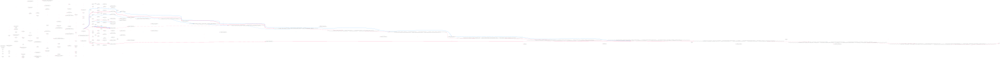

In [ ]:
cf_flow = GraphExplainer(causal_graph, bg, nruns=nruns).shap_values(fg, rankdir='LR')
cf_flow.fold_noise = True
g = cf_flow.draw(sample_ind, show_fg_val=False)#, rankdir='TB')

#### Only f terms

In [ ]:
def langmuir_transformation(f, P):
    return (f*P)/(1 + f*P)

0it [00:00, ?it/s]


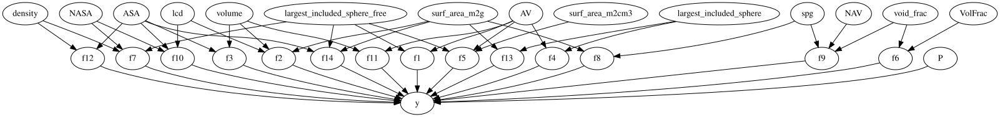

random_catalyst='ITE'


bruteforce sampling: 100%|██████████| 100/100 [00:00<00:00, 141.34it/s]


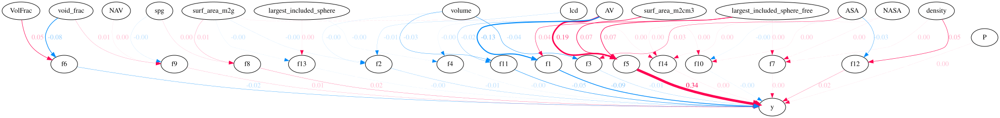

In [ ]:
# SIMPLIFIED SHAPFLOW WITH MINIMAL TERMS

# constants
beta1  = -0.3594413972218853
beta2  = 0.7236283377256563
beta3  = -2.491688880718375
beta4  = 0.09275076505414136
beta5  = 0.9655176044485131
beta6  = 6.602116824421418
beta7  = -8.506535242975505e-06
beta8  = -1.613293940314934
beta9  = 1.275887158343305
beta10 = -4.973935475022366e-06
beta11 = -3.3528986757269825
beta12 = 2.5511241106011875
beta13 = 0.00015360330426490517
beta14 = -5.8135254289460757e-05
constants = [beta1, beta2, beta3, beta4, beta5, beta6, beta7, beta8, beta9, beta10, beta11, beta12, beta13, beta14]

causal_links = CausalLinks()
target_name = 'y'
X_with_only_f_terms = X[['P', 'density', 'spg', 'volume', 'SiOSi_average', 'SiOSi_gmean', 'SiOSi_hmean', 'SiOSi_max', 'SiOSi_mean', 'SiOSi_min', 'SiOSi_skew', 'SiOSi_std', 'SiOSi_var', 'SiO_average', 'SiO_gmean', 'SiO_hmean', 'SiO_max', 'SiO_mean', 'SiO_min', 'SiO_skew', 'SiO_std', 'SiO_var', 'ASA', 'AV', 'NASA', 'NAV', 'VolFrac', 'largest_free_sphere', 'largest_included_sphere', 'largest_included_sphere_free', 'max_dim', 'min_dim', 'mode_dim', 'pld', 'lcd', 'void_frac', 'surf_area_m2g', 'surf_area_m2cm3', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13', 'f14']]
causal_links.add_causes_effects(
    ['P', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13', 'f14'],
    target_name,
    lambda P, *features: sum([beta * langmuir_transformation(f, P) for (beta, f) in zip(constants, features)]),
)

causal_links.add_causes_effects(['AV', 'largest_included_sphere_free'], ['f1'], lambda AV, largest_included_sphere_free: 1/((AV)**2)*np.exp(largest_included_sphere_free))
causal_links.add_causes_effects(['lcd', 'surf_area_m2g', 'volume'], ['f2'], lambda lcd, surf_area_m2g, volume : ((lcd)**2)/np.exp(-surf_area_m2g)/np.exp(-volume))
causal_links.add_causes_effects(['ASA', 'volume'], ['f3'], lambda ASA, volume : np.exp(ASA)/np.exp(volume))
causal_links.add_causes_effects(['AV', 'largest_included_sphere'], ['f4'], lambda AV, largest_included_sphere : ((AV)**3)*((largest_included_sphere)**3))
causal_links.add_causes_effects(['largest_included_sphere_free', 'AV', 'surf_area_m2cm3'], ['f5'], lambda largest_included_sphere_free, AV, surf_area_m2cm3 : np.exp(-largest_included_sphere_free)/((AV)**2)/np.exp(surf_area_m2cm3))
causal_links.add_causes_effects(['VolFrac', 'void_frac'], ['f6'], lambda VolFrac, void_frac : 1/np.exp(VolFrac)*np.exp(void_frac))
causal_links.add_causes_effects(['density', 'largest_included_sphere_free', 'NASA'], ['f7'], lambda density, largest_included_sphere_free, NASA : (density)/np.exp(-largest_included_sphere_free)*((NASA)**3))
causal_links.add_causes_effects(['spg', 'surf_area_m2g'], ['f8'], lambda spg, surf_area_m2g : np.exp(spg)*np.exp(surf_area_m2g))
causal_links.add_causes_effects(['spg', 'NAV', 'void_frac'], ['f9'], lambda spg, NAV, void_frac : np.exp(spg)/np.exp(NAV)/np.exp(void_frac))
causal_links.add_causes_effects(['NASA', 'ASA', 'lcd'], ['f10'], lambda NASA, ASA, lcd : (NASA)*((ASA)**3)/np.exp(lcd))
causal_links.add_causes_effects(['volume', 'AV'], ['f11'], lambda volume, AV : 1/np.exp(volume)/np.exp(AV))
causal_links.add_causes_effects(['density', 'ASA'], ['f12'], lambda density, ASA : np.exp(density)*np.exp(ASA))
causal_links.add_causes_effects(['largest_included_sphere', 'surf_area_m2g'], ['f13'], lambda largest_included_sphere, surf_area_m2g : np.exp(largest_included_sphere)/(surf_area_m2g)*np.exp(-surf_area_m2g))
causal_links.add_causes_effects(['ASA', 'surf_area_m2g', 'largest_included_sphere_free'], ['f14'], lambda ASA, surf_area_m2g, largest_included_sphere_free : np.exp(-ASA)/np.exp(surf_area_m2g)/(largest_included_sphere_free))

causal_graph = build_feature_graph(X_with_only_f_terms, causal_links, target_name=target_name)
causal_graph.draw(rankdir='TB')

nruns = 100 # number of monte carlo samples
sample_ind = 0
random_catalyst = random.choice(list(co2.keys())) # Sample a random catalyst
print(f'{random_catalyst=}')

bg = co2[random_catalyst][373].sample(1).drop(labels=['y'], axis=1) # background sample, no need for multiple sample because of the linearity axiom
bg_pressure_value = bg['P'].iloc[0]
fg = X_with_only_f_terms[X_with_only_f_terms['P'] == bg_pressure_value] # foreground samples to explain. Selecting row from X such that the pressure value is equal to the pressure value of bg
bg = bg[fg.columns] # ensure fg and bg have same column order. NOTE: this only works when there is 1 fg

cf_flow = GraphExplainer(causal_graph, bg, nruns=nruns).shap_values(fg, rankdir='TB')

cf_flow.fold_noise = True
g = cf_flow.draw(sample_ind, show_fg_val=False)#, rankdir='TB')
# g.draw('shapflow_co2_with_only_f_terms.png', prog='dot', format='png')

In [ ]:
fg

,P,density,spg,volume,SiOSi_average,SiOSi_gmean,SiOSi_hmean,SiOSi_max,SiOSi_mean,SiOSi_min,...,f5,f6,f7,f8,f9,f10,f11,f12,f13,f14
25,0.011579,0.320074,-0.676579,-0.348657,0.540045,0.565635,0.590252,-0.287646,0.540045,0.692595,...,48.972567,0.820247,-0.098915,0.483659,0.926009,-0.01208,1.632014,1.780746,-19.86936,-39.70081


In [ ]:
# save graphs
causal_graph.to_graphviz(rankdir='TB').draw(path='co2_causal_graph.png', format='png', prog='dot')
g.draw(f'co2_{random_catalyst}_to_MFS_shapflow_graph.png', prog='dot', format='png')

## N2, CH4, CO2 (other paper)

### Equation

In [ ]:
def n2_323k(P):
    return f"N2 equation at 323K: {P * 2}"  # Replace with actual equation

def n2_373k(P):
    return f"N2 equation at 373K: {P * 3}"  # Replace with actual equation

def ch4_323k(P):
    return f"CH4 equation at 323K: {P * 4}"  # Replace with actual equation

def ch4_373k(P):
    return f"CH4 equation at 373K: {P * 5}"  # Replace with actual equation

def co2_323k(P):
    return f"CO2 equation at 323K: {P * 6}"  # Replace with actual equation

def co2_373k(P):
    return f"CO2 equation at 373K: {P * 7}"  # Replace with actual equation


In [ ]:
def ai_darwin_function(temperature: float, adsorbate: str):
    match (adsorbate.upper(), temperature):
        case ("N2", 323):
            return "Processing N2 at 323 K"
        case ("N2", 373):
            return "Processing N2 at 373 K"
        case ("CH4", 323):
            return "Processing CH4 at 323 K"
        case ("CH4", 373):
            return "Processing CH4 at 373 K"
        case ("CO2", 323):
            return "Processing CO2 at 323 K"
        case ("CO2", 373):
            return "Processing CO2 at 373 K"
        case _:
            return f"Unsupported combination: {adsorbate} at {temperature} K"

# Statistical Approach

ToDo 4/3

- Instead of iterating through (x,y,z) in steps 0.1, we could use actual samples from the data to generate gradients and sum & average!
- Literature search for computational graphs, gradient tracing, shapley values, causal inference, etc.
- Try to draw parallel between shapley values. See if there is a scoring method there.
- Perturbation analysis:

In [ ]:
file_path = '/content/BubbleCol_Data.csv'

# Read the CSV file into a Pandas DataFrame
df = pd.read_csv(file_path)

# Rename columns to our variable names
df.rename(columns={'F1': 'FI1', 'F2' : 'FI2'}, inplace=True)

# Standardize columns using z-score normalization
df = (df - df.mean()) / df.std()

df

,kla,FI1,FI2,CT1,TI1,PI1,eps
0,-1.473389,-0.962129,-2.130736,-0.521895,1.679908,-0.913321,-0.988603
1,-1.473389,-0.962129,-2.130736,-0.521809,1.679803,-0.913315,-0.988603
2,-1.473389,-0.962129,-2.130736,-0.521369,1.679855,-0.913337,-0.988603
3,-1.473389,-0.962129,-2.130736,-0.521286,1.679581,-0.913320,-0.988603
4,-1.473389,-0.962129,-2.130736,-0.521493,1.679709,-0.911983,-0.988603
...,...,...,...,...,...,...,...
90541,0.179279,-0.962028,-2.130736,1.331211,-0.479731,-0.903236,-0.988603
90542,0.179279,-0.962035,-2.130736,1.331211,-0.479731,-0.903236,-0.988603
90543,0.179279,-0.962041,-2.130736,1.331211,-0.479731,-0.903236,-0.988603
90544,0.179279,-0.962046,-2.130736,1.331211,-0.479731,-0.903236,-0.988603


In [ ]:
var1, var2, var3, var4 = 'FI1', 'FI2', 'CT1', 'kla'

# Compute the correlation coefficient between our three vars
correlation_FI1_FI2 = df['FI1'].corr(df['FI2'])
correlation_FI1_CT1 = df['FI1'].corr(df['CT1'])
correlation_FI2_CT1 = df['FI2'].corr(df['CT1'])

correlation_FI1_kla = df['FI1'].corr(df['kla'])
correlation_FI2_kla = df['FI2'].corr(df['kla'])
correlation_CT1_kla = df['CT1'].corr(df['kla'])


print(f'Correlation between {var1} and {var2}: {correlation_FI1_FI2:.3}')
print(f'Correlation between {var1} and {var3}: {correlation_FI1_CT1:.3}')
print(f'Correlation between {var2} and {var3}: {correlation_FI2_CT1:.3}')

print(f'Correlation between {var1} and {var4}: {correlation_FI1_kla:.3}')
print(f'Correlation between {var2} and {var4}: {correlation_FI2_kla:.3}')
print(f'Correlation between {var3} and {var4}: {correlation_CT1_kla:.3}')

Correlation between FI1 and FI2: 0.0889
Correlation between FI1 and CT1: -0.00737
Correlation between FI2 and CT1: -0.292
Correlation between FI1 and kla: 0.547
Correlation between FI2 and kla: 0.467
Correlation between CT1 and kla: 0.0947


In [ ]:
# Compute 0.1 quantile to 0.9 quantile with step size 0.1
FI1_quantiles, FI2_quantiles, CT1_quantiles = [], [], []

for i in range(1, 10):
    percentile = 0.1 * i
    FI1_quantiles.append(df[var1].quantile(percentile))
    FI2_quantiles.append(df[var2].quantile(percentile))
    CT1_quantiles.append(df[var3].quantile(percentile))

In [ ]:
def sum_gradients(gradient_sums, nodes):
    """
    Sums absolute value of gradients of each term in
    computational graph with it's old gradient sum
    """

    for n in nodes:
        gradient_sums[n.label] = gradient_sums.get(n.label, 0) + abs(n.grad)

In [ ]:
gradient_sums = {}
count = 0

# Iterate through every combination of quantile of the three input vars
for CT1_quantile in CT1_quantiles:
    for FI1_quantile in FI1_quantiles:
        for FI2_quantile in FI2_quantiles:
            Value.reset()
            count += 1

            # input variables
            CT1 = Value(CT1_quantile, label='CT1')
            FI1 = Value(FI1_quantile, label='FI1')
            FI2 = Value(FI2_quantile, label='FI2')

            # constants
            beta1   = Value(0.00913647,     label='beta1')
            beta2   = Value(0.06013975,     label='beta2')
            beta3   = Value(-0.00306957,    label='beta3')
            beta4   = Value(-0.00022621,    label='beta4')
            beta5   = Value(-0.00948349,    label='beta5')
            beta6   = Value(-0.04911336,    label='beta6')
            beta7   = Value(-0.09026852,    label='beta7')
            beta8   = Value(-0.03344445,    label='beta8')
            beta9   = Value(-0.03477052,    label='beta9')
            b       = Value(0.1958815,      label='b')

            # f terms
            f1      = beta1 * (-CT1)*(-FI1)*(-FI1).exp()        ; f1.label = 'f1'
            f2      = beta2 * (-FI1)*(-CT1).exp()               ; f2.label = 'f2'
            f3      = beta3 * (-FI1)*(-FI1).exp()*(-FI1**3)     ; f3.label = 'f3'
            f4      = beta4 * (FI1**3)*(-CT1**2)*(FI1).exp()    ; f4.label = 'f4'
            f5      = beta5 * (-CT1)*(-FI1).exp()*(-FI1).exp()  ; f5.label = 'f5'
            f6      = beta6 * (CT1)*(FI2).exp()                 ; f6.label = 'f6'
            f7      = beta7 * (-CT1)*(-CT1).exp()               ; f7.label = 'f7'
            f8      = beta8 * (CT1)*(FI1**2)*(-CT1).exp()       ; f8.label = 'f8'
            f9      = beta9 * (-FI1).exp()*(-FI1).exp()         ; f9.label = 'f9'

            y = f1 + f2 + f3 + f4 + f5 + f6 + f7 + f8 + f9 + b  ; y.label  = 'y'

            # Perform backprop
            y.backward() # after calling backward, each instance of Value should have a gradient

            # Extract nodes from computational graph
            nodes, _ = trace(y)

            # Sum gradients
            sum_gradients(gradient_sums, nodes)

# Calculate average gradient for each term
gradient_avgs = { label : grad / count for label, grad in gradient_sums.items()}

In [ ]:
# Sort gradient_avgs in order of greatest avg gradient to least avg gradient
gradient_avgs = {k: v for k, v in sorted(gradient_avgs.items(), key=lambda item: item[1], reverse=True)}

# Assign each node's score to its average gradient
for n in nodes:
    n.score = gradient_avgs[n.label]

# Print 10 terms with the highest avg gradients (i.e. highest scores)
pprint(list(gradient_avgs.items())[:10])


[('beta9', 3.8008087913358164),
 ('((-CT1)*beta5)', 3.8008087913358164),
 ('beta5', 2.162671474059135),
 ('(e^((-FI1))*((-CT1)*beta5))', 1.6037254658200881),
 ('((-FI1)*((-CT1)*beta1))', 1.6037254658200881),
 ('(e^((-FI1))*beta9)', 1.6037254658200881),
 ('((-CT1)*beta1)', 1.5374135068994037),
 ('((-(CT1**2))*((FI1**3)*beta4))', 1.4406843960225204),
 ('(CT1*beta6)', 1.4388667553502905),
 ('((-FI1)*beta3)', 1.4189520014247659)]


In [ ]:
graph = draw_computational_graph_with_score(y, rankdir='TB')

graph.render('score')

'score.png'

In [ ]:
"""
This cell serves as a reminder that multiple variables have the same
label. Thus, when we calculate gradient_avgs and gradient_sums each
term is not treated separately.

Example: -CI1 is a variable that has multiple instances of itself in
the computational graph. Each instance of -CI1 will share the same
gradient_avg and gradient_sum because the function was sum_gradients
was implemented by assuming unique labels for each term. This is not
a bug. This behavior is intended.
"""
counter = {}
for n in nodes:
    counter[n.label] = counter.get(n.label, 0) + 1
pprint(counter)

# Perturbation Approach

Perturb input vars by some delta and see how output is affected. Graph the results of this perturbation.

In [ ]:
def perturb(var_of_interest_idx, input_vars, evaluate_fn, delta=1e-1):
    # calculate initial y value (e.g,)
    y_old = evaluate_fn(*input_vars).data

    #perturb var by delta
    input_vars_cp = input_vars[:] # need to copy input_vars because we don't want to update input_vars itself. We just need to temporarily update it.
    input_vars_cp[var_of_interest_idx] += delta

    # evaluate new y-value
    y_new = evaluate_fn(*input_vars_cp).data

    return y_old, y_new, y_new - y_old

In [ ]:
input_var_names = ['CT1', 'FI1', 'FI2']
CT1 = FI1 = FI2 = 0.1
input_vars = [CT1, FI1, FI2]
print(f"{input_vars=}")
delta_range = np.linspace(-2, 2, 20, endpoint=True)
print(f'{delta_range=}')
Y_diff = [[] for i in range(len(input_vars))]

for var_idx, input_var in enumerate(input_vars):
    for delta in delta_range:

        y_old, y_new, y_diff = perturb(var_idx, input_vars, bubble_column_function, delta)
        Y_diff[var_idx].append(y_diff)
        # print(f"var={input_var_names[var_idx]:<5} {input_var_names[var_idx]:<4} value={input_vars[var_idx]:9.4f}, {delta=:7.3f}, {y_old=:20.4f}, {y_new=:20.4f}, {y_diff=:20.4f}")

input_vars=[0.1, 0.1, 0.1]
delta_range=array([-2.        , -1.78947368, -1.57894737, -1.36842105, -1.15789474,
       -0.94736842, -0.73684211, -0.52631579, -0.31578947, -0.10526316,
        0.10526316,  0.31578947,  0.52631579,  0.73684211,  0.94736842,
        1.15789474,  1.36842105,  1.57894737,  1.78947368,  2.        ])


In [ ]:
Y_diff = np.array(Y_diff)

In [ ]:
Y_diff[:, 10]

array([0.00438102, 0.00027008, 0.        ])

## TODO:

We are given the mean of each input variable and the standard deviation. We can starting values for each input varaiable using normal dist with mean and std.
These starting values will be our x axis. Our y axis will be the delta_range (i.e. how much we perturb the input variable). Our z axis will be y_diff, the difference in the final output.

The amount we perturb the var should be a function of std. The greater the std, the more we perturb, and vice versa.

## Questions:

What does this line mean 'Please note that the variables used in the model are normalized: normalized var = (input var - mean of input var)/(std dev of input var)'? If each variable actually has mean 1 and std 1, then we don't need to worry about the above details.

Best way to parse the equation?

When building the pipeline, should I assume that I'm reading from the AI DARWIN .txt file?

Can you explain the interdependent equation at the bottom of this notebook.

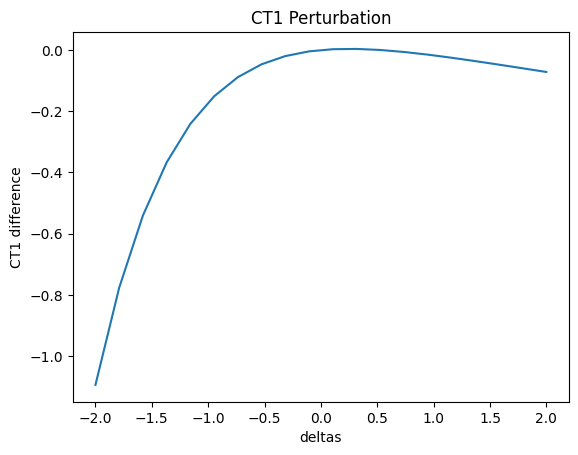

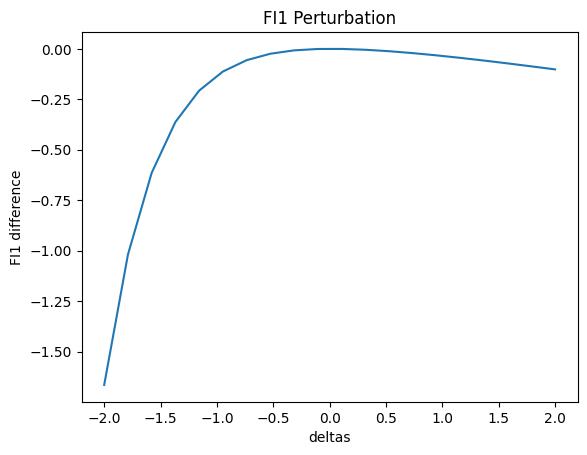

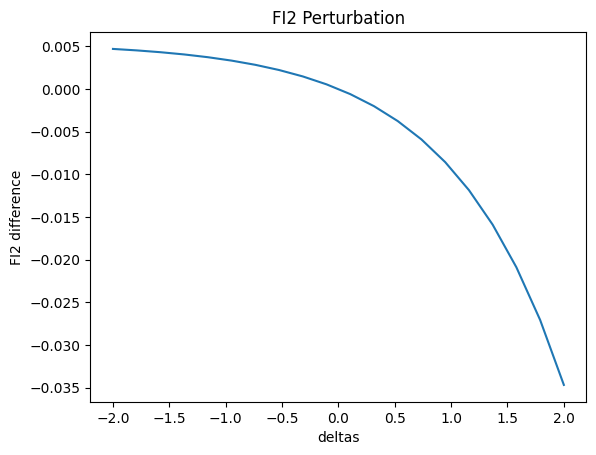

In [ ]:
def plot_2d(input_var_names, delta_range, Y_diff):
    for idx, name in enumerate(input_var_names):

        # Plot the graph
        plt.plot(delta_range, Y_diff[idx])

        # Add labels and title
        plt.xlabel('deltas')
        plt.ylabel(f'{name} difference')
        plt.title(f'{name} Perturbation')

        # Save plot
        plt.savefig(f'{name}_perturbation.png')

        # Show the plot
        plt.show()

plot_2d(input_var_names, delta_range, Y_diff)

In [ ]:
"""
kla = 0.02765969*np.sin(CT1)*1*1 + -0.01159858*np.sin(-CT1)*np.cos(F2)/np.exp(F1/F2) + 0.01301839*np.sin(F2)*(-F1/F2)/np.exp(F1) + 0.01941787*np.sin(F2)*np.cos(-F2)*(-PI1) + -0.01600857*np.sin(-F1)*(F2/F1)**2/np.exp(F1/F2) + -0.01273757*np.sin(CT1)*np.cos(-F1)*np.exp(-PI1) + 1e-08*np.sin(-F1)/(-CT1)**2*np.exp(F1) + 0.05747288*np.sin(F2)*np.cos(-F1)*np.exp(-CT1) + -0.00039062*np.sin(-F2)*np.cos(F2/F1)*np.exp(F2/F1) + 0.08156639
kla = -0.01684746*np.sin(-CT1)/1/np.exp(-F2) + -0.03307027*np.sin(-F1)*np.cos(-F1)*np.exp(-F1) + 0.0030141*np.sin(-CT1)/np.tan(CT1)*1 + 0.00823457*np.tan(-CT1)*np.cos(-CT1)*np.exp(-F1) + 0.00207325*np.sin(-F2)*(-PI1)*np.exp(F1) + -0.08085769*np.sin(-F2)/1*np.sin(-CT1) + 0.001351*(-F1)/1*np.exp(-F2) + -0.00197294*np.sin(CT1)/1*(-F1)**3 + 0.00287253*np.sin(F2)/1/np.exp(F2) + 0.09648435
DeltaU2 = -1494.36378×1×exp(density) + 1022.55302×(largest_included_sphere_free)×(lcd) + -348.30389×1×(NAV) + 87.17352×(NAV²)×exp(density) + -15.34721×(VolFrac²)×(pld) + -23.03113×(lcd)×(largest_included_sphere) + 1050.86679×exp(surf_area_m2g)×exp(density) + -760.82389×1×(surf_area_m2g) + -894.87758×(largest_included_sphere_free²)×1 + -76.6357×(NASA²)×(spg) + 480.04213×1×(largest_free_sphere) + -153.00754×(void_frac)×(spg²) + 1.5928×exp(NAV)×1 + 65.4859×(spg²)×(NASA²) + -837.47272×exp(density)×(void_frac) + -21925.6095
"""

'\nkla = 0.02765969*np.sin(CT1)*1*1 + -0.01159858*np.sin(-CT1)*np.cos(F2)/np.exp(F1/F2) + 0.01301839*np.sin(F2)*(-F1/F2)/np.exp(F1) + 0.01941787*np.sin(F2)*np.cos(-F2)*(-PI1) + -0.01600857*np.sin(-F1)*(F2/F1)**2/np.exp(F1/F2) + -0.01273757*np.sin(CT1)*np.cos(-F1)*np.exp(-PI1) + 1e-08*np.sin(-F1)/(-CT1)**2*np.exp(F1) + 0.05747288*np.sin(F2)*np.cos(-F1)*np.exp(-CT1) + -0.00039062*np.sin(-F2)*np.cos(F2/F1)*np.exp(F2/F1) + 0.08156639\nkla = -0.01684746*np.sin(-CT1)/1/np.exp(-F2) + -0.03307027*np.sin(-F1)*np.cos(-F1)*np.exp(-F1) + 0.0030141*np.sin(-CT1)/np.tan(CT1)*1 + 0.00823457*np.tan(-CT1)*np.cos(-CT1)*np.exp(-F1) + 0.00207325*np.sin(-F2)*(-PI1)*np.exp(F1) + -0.08085769*np.sin(-F2)/1*np.sin(-CT1) + 0.001351*(-F1)/1*np.exp(-F2) + -0.00197294*np.sin(CT1)/1*(-F1)**3 + 0.00287253*np.sin(F2)/1/np.exp(F2) + 0.09648435\nDeltaU2 = -1494.36378×1×exp(density) + 1022.55302×(largest_included_sphere_free)×(lcd) + -348.30389×1×(NAV) + 87.17352×(NAV²)×exp(density) + -15.34721×(VolFrac²)×(pld) + -23.031